# Donors choose data analysis using Random Forests & Gradient Boosting 

<h4><a id="about_data"></a></h4>

## Little History about Data Set

Founded in 2000 by a high school teacher in the Bronx, DonorsChoose.org empowers public school teachers from across the country to request much-needed materials and experiences for their students. At any given time, there are thousands of classroom requests that can be brought to life with a gift of any amount.

## Answers to What and Why Questions on Data Set

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_4:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


<a id="first_part"></a>
## Importing required libraries

In [1]:
# numpy for easy numerical computations
import numpy as np
# pandas for dataframes and filterings
import pandas as pd
# sqlite3 library for performing operations on sqlite file
import sqlite3
# matplotlib for plotting graphs
import matplotlib.pyplot as plt
# seaborn library for easy plotting
import seaborn as sbrn
# warnings library for specific settings
import warnings
# regularlanguage for regex operations
import re
# For loading precomputed models
import pickle
# For loading natural language processing tool-kit
import nltk
# For calculating mathematical terms
import math
# For plotting 3-D Plot
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
# For generating random numbers
import random

# For storing the model
from joblib import dump, load
# For loading files from google drive
from google.colab import drive
# For working with files in google drive
drive.mount('/content/drive')
# tqdm for tracking progress of loops
from tqdm import tqdm_notebook as tqdm
# For creating dictionary of words
from collections import Counter
# For creating BagOfWords Model
from sklearn.feature_extraction.text import CountVectorizer
# For creating TfidfModel
from sklearn.feature_extraction.text import TfidfVectorizer
# For standardizing values
from sklearn.preprocessing import StandardScaler
# For merging sparse matrices along row direction
from scipy.sparse import hstack
# For merging sparse matrices along column direction
from scipy.sparse import vstack
# For converting dataframes into sparse matrix
from scipy.sparse import csr_matrix
# For calculating TSNE values
from sklearn.manifold import TSNE
# For calculating the accuracy score on cross validate data
from sklearn.metrics import accuracy_score
# For performing the k-fold cross validation
from sklearn.model_selection import cross_val_score
# For splitting the data set into test and train data
from sklearn import model_selection
# For using decison tree classifier
from sklearn import tree
# For generating word cloud
from wordcloud import WordCloud
# For using random forest classifier
from sklearn.ensemble import RandomForestClassifier
# For using gradient boosting classifier
import xgboost as xgb
# For predicting probability values
from sklearn.calibration import CalibratedClassifierCV
# For plotting decision tree
import graphviz
# For using svm classifer - hinge loss function of sgd
from sklearn import linear_model
# For creating samples for making dataset balanced
from sklearn.utils import resample
# For shuffling the dataframes
from sklearn.utils import shuffle
# For calculating roc_curve parameters
from sklearn.metrics import roc_curve
# For calculating auc value
from sklearn.metrics import auc
# For displaying results in table format
from prettytable import PrettyTable
# For generating confusion matrix
from sklearn.metrics import confusion_matrix
# For using gridsearch cv to find best parameter
from sklearn.model_selection import GridSearchCV
# For using randomized search cross validation
from sklearn.model_selection import RandomizedSearchCV
# For performing min-max standardization to features
from sklearn.preprocessing import MinMaxScaler
# For calculating sentiment score of the text
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

warnings.filterwarnings('ignore')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


/usr/local/lib/python3.6/dist-packages/nltk/twitter/__init__.py:20: UserWarning:

The twython library has not been installed. Some functionality from the twitter package will not be available.



[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


## Reading and Storing Data

In [0]:
projectsData = pd.read_csv('drive/My Drive/train_data.csv');
resourcesData = pd.read_csv('drive/My Drive/resources.csv');

In [3]:
projectsData.head(3)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,"History & Civics, Health & Sports","Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Health & Sports,"Health & Wellness, Team Sports",Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,0


In [4]:
projectsData.tail(3)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
109245,143653,p155633,cdbfd04aa041dc6739e9e576b1fb1478,Mrs.,NJ,2016-08-25 17:11:32,Grades PreK-2,"Literacy & Language, Math & Science","Literacy, Mathematics",2016/2017 Beginning of the Year Basics,This is a great group of sharing and caring st...,"My students learn about special events, holida...",NaN,NaN,My students need giant comfy pillows in order ...,3,1
109246,164599,p206114,6d5675dbfafa1371f0e2f6f1b716fe2d,Mrs.,NY,2016-07-29 17:53:15,Grades 3-5,"Health & Sports, Special Needs","Health & Wellness, Special Needs",Flexible Seating in Inclusive Classroom,Our students live in a small rural community. ...,Flexible classroom seating has been researched...,NaN,NaN,My students need flexible seating options: bea...,0,1
109247,128381,p191189,ca25d5573f2bd2660f7850a886395927,Ms.,VA,2016-06-29 09:17:01,Grades 6-8,"Applied Learning, Math & Science","College & Career Prep, Mathematics",Classroom Tech to Develop 21st Century Leaders,When was the last time that you used math? Pro...,"According to Forbes Magazine (2014), companies...",NaN,NaN,My students need opportunities to work with te...,0,1


In [5]:
resourcesData.head(3)

,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95
2,p069063,Cory Stories: A Kid's Book About Living With Adhd,1,8.45


In [6]:
resourcesData.tail(3)

,id,description,quantity,price
1541269,p031981,Black Electrical Tape (GIANT 3 PACK) Each Roll...,6,8.99
1541270,p031981,Flormoon DC Motor Mini Electric Motor 0.5-3V 1...,2,8.14
1541271,p031981,WAYLLSHINE 6PCS 2 x 1.5V AAA Battery Spring Cl...,2,7.39


### Helper functions and classes

In [0]:
def equalsBorder(numberOfEqualSigns):
    """
    This function prints passed number of equal signs
    """
    print("="* numberOfEqualSigns);

In [0]:
# Citation link: https://stackoverflow.com/questions/8924173/how-do-i-print-bold-text-in-python
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [0]:
def printStyle(text, style):
    "This function prints text with the style passed to it"
    print(style + text + color.END);

### Shapes of projects data and resources data

In [10]:
printStyle("Number of data points in projects data: {}".format(projectsData.shape[0]), color.BOLD);
printStyle("Number of attributes in projects data:{}".format(projectsData.shape[1]), color.BOLD);
equalsBorder(60);
printStyle("Number of data points in resources data: {}".format(resourcesData.shape[0]), color.BOLD);
printStyle("Number of attributes in resources data: {}".format(resourcesData.shape[1]), color.BOLD);

Number of data points in projects data: 109248
Number of attributes in projects data:17
Number of data points in resources data: 1541272
Number of attributes in resources data: 4


In [0]:
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
def cleanCategories(subjectCategories):
    cleanedCategories = []
    for subjectCategory in tqdm(subjectCategories):
        tempCategory = ""
        for category in subjectCategory.split(","):
            if 'The' in category.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
                category = category.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
            category = category.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
            tempCategory += category.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
            tempCategory = tempCategory.replace('&','_')
        cleanedCategories.append(tempCategory)
    return cleanedCategories

In [12]:
# projectDataWithCleanedCategories = pd.DataFrame(projectsData);
subjectCategories = list(projectsData.project_subject_categories);
cleanedCategories = cleanCategories(subjectCategories);
printStyle("Sample categories: ", color.BOLD);
equalsBorder(60);
print(subjectCategories[0:5]);
equalsBorder(60);
printStyle("Sample cleaned categories: ", color.BOLD);
equalsBorder(60);
print(cleanedCategories[0:5]);
projectsData['cleaned_categories'] = cleanedCategories;
projectsData.head(5)


Sample categories: 
['Literacy & Language', 'History & Civics, Health & Sports', 'Health & Sports', 'Literacy & Language, Math & Science', 'Math & Science']
Sample cleaned categories: 
['Literacy_Language ', 'History_Civics Health_Sports ', 'Health_Sports ', 'Literacy_Language Math_Science ', 'Math_Science ']


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,cleaned_categories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,"History & Civics, Health & Sports","Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Health & Sports,"Health & Wellness, Team Sports",Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,0,Health_Sports
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs.,KY,2016-10-06 21:16:17,Grades PreK-2,"Literacy & Language, Math & Science","Literacy, Mathematics",Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,NaN,NaN,My students need to engage in Reading and Math...,4,1,Literacy_Language Math_Science
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs.,TX,2016-07-11 01:10:09,Grades PreK-2,Math & Science,Mathematics,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",NaN,NaN,My students need hands on practice in mathemat...,1,1,Math_Science


In [13]:
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
categoriesCounter = Counter()
for subjectCategory in projectsData.cleaned_categories.values:
    categoriesCounter.update(subjectCategory.split());
categoriesCounter

Counter({'AppliedLearning': 12135,
         'Care_Hunger': 1388,
         'Health_Sports': 14223,
         'History_Civics': 5914,
         'Literacy_Language': 52239,
         'Math_Science': 41421,
         'Music_Arts': 10293,
         'SpecialNeeds': 13642,
         'Warmth': 1388})

In [14]:
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
categoriesDictionary = dict(categoriesCounter);
sortedCategoriesDictionary = dict(sorted(categoriesDictionary.items(), key = lambda keyValue: keyValue[1]));
sortedCategoriesData = pd.DataFrame.from_dict(sortedCategoriesDictionary, orient='index');
sortedCategoriesData.columns = ['subject_categories'];
printStyle("Number of projects by Subject Categories: ", color.BOLD);
equalsBorder(60);
sortedCategoriesData

Number of projects by Subject Categories: 


,subject_categories
Warmth,1388
Care_Hunger,1388
History_Civics,5914
Music_Arts,10293
AppliedLearning,12135
SpecialNeeds,13642
Health_Sports,14223
Math_Science,41421
Literacy_Language,52239


In [15]:
subjectSubCategories = projectsData.project_subject_subcategories;
cleanedSubCategories = cleanCategories(subjectSubCategories);
printStyle("Sample subject sub categories: ", color.BOLD);
equalsBorder(70);
print(subjectSubCategories[0:5]);
equalsBorder(70);
printStyle("Sample cleaned subject sub categories: ", color.BOLD);
equalsBorder(70);
print(cleanedSubCategories[0:5]);
projectsData['cleaned_sub_categories'] = cleanedSubCategories;


Sample subject sub categories: 
0                       ESL, Literacy
1    Civics & Government, Team Sports
2      Health & Wellness, Team Sports
3               Literacy, Mathematics
4                         Mathematics
Name: project_subject_subcategories, dtype: object
Sample cleaned subject sub categories: 
['ESL Literacy ', 'Civics_Government TeamSports ', 'Health_Wellness TeamSports ', 'Literacy Mathematics ', 'Mathematics ']


In [16]:
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
subjectsSubCategoriesCounter = Counter();
for subCategory in projectsData.cleaned_sub_categories:
    subjectsSubCategoriesCounter.update(subCategory.split());
subjectsSubCategoriesCounter

Counter({'AppliedSciences': 10816,
         'Care_Hunger': 1388,
         'CharacterEducation': 2065,
         'Civics_Government': 815,
         'College_CareerPrep': 2568,
         'CommunityService': 441,
         'ESL': 4367,
         'EarlyDevelopment': 4254,
         'Economics': 269,
         'EnvironmentalScience': 5591,
         'Extracurricular': 810,
         'FinancialLiteracy': 568,
         'ForeignLanguages': 890,
         'Gym_Fitness': 4509,
         'Health_LifeScience': 4235,
         'Health_Wellness': 10234,
         'History_Geography': 3171,
         'Literacy': 33700,
         'Literature_Writing': 22179,
         'Mathematics': 28074,
         'Music': 3145,
         'NutritionEducation': 1355,
         'Other': 2372,
         'ParentInvolvement': 677,
         'PerformingArts': 1961,
         'SocialSciences': 1920,
         'SpecialNeeds': 13642,
         'TeamSports': 2192,
         'VisualArts': 6278,
         'Warmth': 1388})

In [17]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
dictionarySubCategories = dict(subjectsSubCategoriesCounter);
sortedDictionarySubCategories = dict(sorted(dictionarySubCategories.items(), key = lambda keyValue: keyValue[1]));
sortedSubCategoriesData = pd.DataFrame.from_dict(sortedDictionarySubCategories, orient = 'index');
sortedSubCategoriesData.columns = ['subject_sub_categories']
printStyle("Number of projects sorted by subject sub categories: ", color.BOLD);
equalsBorder(70);
sortedSubCategoriesData

Number of projects sorted by subject sub categories: 


,subject_sub_categories
Economics,269
CommunityService,441
FinancialLiteracy,568
ParentInvolvement,677
Extracurricular,810
Civics_Government,815
ForeignLanguages,890
NutritionEducation,1355
Warmth,1388
Care_Hunger,1388


In [18]:
projectsData['project_essay'] = projectsData['project_essay_1'].map(str) + projectsData['project_essay_2'].map(str) + \
                                projectsData['project_essay_3'].map(str) + projectsData['project_essay_4'].map(str);
projectsData.head(5)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,cleaned_categories,cleaned_sub_categories,project_essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,"History & Civics, Health & Sports","Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Health & Sports,"Health & Wellness, Team Sports",Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,0,Health_Sports,Health_Wellness TeamSports,"\r\n\""True champions aren't always the ones th..."
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs.,KY,2016-10-06 21:16:17,Grades PreK-2,"Literacy & Language, Math & Science","Literacy, Mathematics",Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,NaN,NaN,My students need to engage in Reading and Math...,4,1,Literacy_Language Math_Science,Literacy Mathematics,I work at a unique school filled with both ESL...
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs.,TX,2016-07-11 01:10:09,Grades PreK-2,Math & Science,Mathematics,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",NaN,NaN,My students need hands on practice in mathemat...,1,1,Math_Science,Mathematics,Our second grade classroom next year will be m...


In [19]:
priceAndQuantityData = resourcesData.groupby('id').agg({'price': 'sum', 'quantity': 'sum'}).reset_index();
priceAndQuantityData.head(5)

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21
2,p000003,298.97,4
3,p000004,1113.69,98
4,p000005,485.99,8


In [20]:
projectsData.shape

(109248, 20)

In [21]:
projectsData = pd.merge(projectsData, priceAndQuantityData, on = 'id', how = 'left');
print(projectsData.shape);
projectsData.head(3)

(109248, 22)


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,cleaned_categories,cleaned_sub_categories,project_essay,price,quantity
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,154.60,23
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,"History & Civics, Health & Sports","Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,299.00,1
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Health & Sports,"Health & Wellness, Team Sports",Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,0,Health_Sports,Health_Wellness TeamSports,"\r\n\""True champions aren't always the ones th...",516.85,22


In [22]:
projectsData[projectsData['id'] == 'p253737']

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,cleaned_categories,cleaned_sub_categories,project_essay,price,quantity
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,154.6,23


In [23]:
priceAndQuantityData[priceAndQuantityData['id'] == 'p253737']

,id,price,quantity
253736,p253737,154.6,23


<a id="pre_processing_data"></a>
## Preprocessing data

In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# All stopwords that are needed to be removed in the text
stopWords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]);
def preProcessingWithAndWithoutStopWords(texts):
    """
    This function takes list of texts and returns preprocessed list of texts one with
    stop words and one without stopwords.
    """
    # Variable for storing preprocessed text with stop words
    preProcessedTextsWithStopWords = [];
    # Variable for storing preprocessed text without stop words
    preProcessedTextsWithoutStopWords = [];
    
    # Looping over list of texts for performing pre processing
    for text in tqdm(texts, total = len(texts)):
        # Removing all links in the text
        text = re.sub(r"http\S+", "", text);

        # Removing all html tags in the text
        text = re.sub(r"<\w+/>", "", text);
        text = re.sub(r"<\w+>", "", text);
        
        # https://stackoverflow.com/a/47091490/4084039
        # Replacing all below words with adverbs
        text = re.sub(r"won't", "will not", text)
        text = re.sub(r"can\'t", "can not", text)
        text = re.sub(r"n\'t", " not", text)
        text = re.sub(r"\'re", " are", text)
        text = re.sub(r"\'s", " is", text)
        text = re.sub(r"\'d", " would", text)
        text = re.sub(r"\'ll", " will", text)
        text = re.sub(r"\'t", " not", text)
        text = re.sub(r"\'ve", " have", text)
        text = re.sub(r"\'m", " am", text)
        
        # Removing backslash symbols in text
        text = text.replace('\\r', ' ');
        text = text.replace('\\n', ' ');
        text = text.replace('\\"', ' ');
        
        # Removing all special characters of text
        text = re.sub(r"[^a-zA-Z0-9]+", " ", text);
        
        # Converting whole review text into lower case
        text = text.lower();
        
        # adding this preprocessed text without stopwords to list
        preProcessedTextsWithStopWords.append(text);
        
        # removing stop words from text
        textWithoutStopWords = ' '.join([word for word in text.split() if word not in stopWords]);
        # adding this preprocessed text without stopwords to list
        preProcessedTextsWithoutStopWords.append(textWithoutStopWords);

    return [preProcessedTextsWithStopWords, preProcessedTextsWithoutStopWords];

In [25]:
texts = [projectsData['project_essay'].values[0]]
preProcessedTextsWithStopWords, preProcessedTextsWithoutStopWords = preProcessingWithAndWithoutStopWords(texts);
print("Example project essay without pre-processing: ");
equalsBorder(70);
print(texts);
equalsBorder(70);
print("Example project essay with stop words and pre-processing: ");
equalsBorder(70);
print(preProcessedTextsWithStopWords);
equalsBorder(70);
print("Example project essay without stop words and pre-processing: ");
equalsBorder(70);
print(preProcessedTextsWithoutStopWords);


Example project essay without pre-processing: 
['My students are English learners that are working on English as their second or third languages. We are a melting pot of refugees, immigrants, and native-born Americans bringing the gift of language to our school. \\r\\n\\r\\n We have over 24 languages represented in our English Learner program with students at every level of mastery.  We also have over 40 countries represented with the families within our school.  Each student brings a wealth of knowledge and experiences to us that open our eyes to new cultures, beliefs, and respect.\\"The limits of your language are the limits of your world.\\"-Ludwig Wittgenstein  Our English learner\'s have a strong support system at home that begs for more resources.  Many times our parents are learning to read and speak English along side of their children.  Sometimes this creates barriers for parents to be able to help their child learn phonetics, letter recognition, and other reading skills.\\r\

In [26]:
projectEssays = projectsData['project_essay'];
preProcessedEssaysWithStopWords, preProcessedEssaysWithoutStopWords = preProcessingWithAndWithoutStopWords(projectEssays);

In [27]:
preProcessedEssaysWithoutStopWords[0:3]

['students english learners working english second third languages melting pot refugees immigrants native born americans bringing gift language school 24 languages represented english learner program students every level mastery also 40 countries represented families within school student brings wealth knowledge experiences us open eyes new cultures beliefs respect limits language limits world ludwig wittgenstein english learner strong support system home begs resources many times parents learning read speak english along side children sometimes creates barriers parents able help child learn phonetics letter recognition reading skills providing dvd players students able continue mastery english language even no one home able assist families students within level 1 proficiency status offered part program educational videos specially chosen english learner teacher sent home regularly watch videos help child develop early reading skills parents not access dvd player opportunity check dvd 

In [28]:
projectTitles = projectsData['project_title'];
preProcessedProjectTitlesWithStopWords, preProcessedProjectTitlesWithoutStopWords = preProcessingWithAndWithoutStopWords(projectTitles);
preProcessedProjectTitlesWithoutStopWords[0:5]

['educational support english learners home',
 'wanted projector hungry learners',
 'soccer equipment awesome middle school students',
 'techie kindergarteners',
 'interactive math tools']

In [29]:
projectsData['preprocessed_titles'] = preProcessedProjectTitlesWithoutStopWords;
projectsData['preprocessed_essays'] = preProcessedEssaysWithoutStopWords;
projectsData.shape

(109248, 24)

## Preparing data for classification and modelling

In [30]:
pd.DataFrame(projectsData.columns, columns = ['All features in projects data'])

,All features in projects data
0,Unnamed: 0
1,id
2,teacher_id
3,teacher_prefix
4,school_state
5,project_submitted_datetime
6,project_grade_category
7,project_subject_categories
8,project_subject_subcategories
9,project_title


### Useful features:
#### Here we will consider only below features for classification and we can ignore the other features

##### Categorical data:
1. <b>school_state</b> - categorical data
2. <b>project_grade_category</b> - categorical data
3. <b>cleaned_categories</b> - categorical data
4. <b>cleaned_sub_categories</b> - categorical data
5. <b>teacher_prefix</b> - categorical data

##### Text data:
1. <b>project_resource_summary</b> - text data
2. <b>project_title - text data</b>
3. <b>project_resource_summary</b> - text data

##### Numerical data:
1. <b>teacher_number_of_previously_posted_projects</b> - numerical data
2. <b>price</b> - numerical data
3. <b>quantity</b> - numerical data

<a id="classification_using_support_vector_machine"></a>
# Classification & Modelling using random forests & Gradient Boosting

<h3><font color='blue'>Splitting Data(Only training and test)</font></h3>

In [31]:
projectsData = projectsData.dropna(subset = ['teacher_prefix']);
projectsData.shape

(109245, 24)

In [32]:
classesData = projectsData['project_is_approved']
print(classesData.shape)

(109245,)


In [0]:
trainingData, testData, classesTraining, classesTest = model_selection.train_test_split(projectsData[0:60000], classesData[0:60000], test_size =  0.3, random_state = 44, stratify = classesData[0:60000]);
trainingData, crossValidateData, classesTraining, classesCrossValidate = model_selection.train_test_split(trainingData, classesTraining, test_size = 0.3, random_state = 0, stratify = classesTraining);

In [34]:
print("Shapes of splitted data: ");
equalsBorder(70);

print("testData shape: ", testData.shape);
print("classesTest: ", classesTest.shape);
print("trainingData shape: ", trainingData.shape);
print("classesTraining shape: ", classesTraining.shape);

Shapes of splitted data: 
testData shape:  (18000, 24)
classesTest:  (18000,)
trainingData shape:  (29400, 24)
classesTraining shape:  (29400,)


In [35]:
print("Number of negative points: ", trainingData[trainingData['project_is_approved'] == 0].shape);
print("Number of positive points: ", trainingData[trainingData['project_is_approved'] == 1].shape);

Number of negative points:  (4481, 24)
Number of positive points:  (24919, 24)


In [0]:
vectorizedFeatureNames = [];

## Vectorizing categorical data

### 1. Vectorizing cleaned_categories(project_subject_categories cleaned) - Response Encoding

In [37]:
# Categorizing subjects categories feature using response encoding
subjectsCategoriesResponseData = [dict(), dict()];
for index, dataPoint in trainingData.iterrows():
    subjectCategory = dataPoint['cleaned_categories'];
    classValue = dataPoint['project_is_approved'];
    if(subjectCategory in subjectsCategoriesResponseData[classValue]):
      subjectsCategoriesResponseData[classValue][subjectCategory] += 1;
    else:
      subjectsCategoriesResponseData[classValue][subjectCategory] = 1;
allSubjectCategories = set(list(subjectsCategoriesResponseData[0].keys()) + list(subjectsCategoriesResponseData[1].keys()));
for subjectCategory in allSubjectCategories:
  if(subjectCategory not in subjectsCategoriesResponseData[0]):
    subjectsCategoriesResponseData[0][subjectCategory] = 0;
  if(subjectCategory not in subjectsCategoriesResponseData[1]):
    subjectsCategoriesResponseData[1][subjectCategory] = 0;
def subjectsCategoriesTransform(subjectCategories):
  transformedData = pd.DataFrame(columns = ['SubjectsCategories0', 'SubjectsCategories1']);
  numRows = len(subjectCategories);
  for index, subjectCategory in enumerate(tqdm(subjectCategories)):
    if subjectCategory in allSubjectCategories:
      class0Value = subjectsCategoriesResponseData[0][subjectCategory];
      class1Value = subjectsCategoriesResponseData[1][subjectCategory];
      totalValue = class0Value + class1Value;
      class0Value = class0Value / totalValue;
      class1Value = class1Value / totalValue;
      transformedData.loc[index] = [class0Value, class1Value];
    else:
      transformedData.loc[index] = [0.5, 0.5];
  return csr_matrix(transformedData);
categoriesVector = subjectsCategoriesTransform(trainingData['cleaned_categories'].values);

In [38]:
print("Features used in vectorizing subject categories: ");
equalsBorder(70);
print(list(allSubjectCategories));
equalsBorder(70);
print("Shape of cleaned_categories matrix after vectorization(response encoding): ", categoriesVector.shape);
equalsBorder(70);
print("Sample vectors of categories: ");
equalsBorder(70);
print(categoriesVector[0:4])

Features used in vectorizing subject categories: 
['AppliedLearning History_Civics ', 'Literacy_Language Health_Sports ', 'Music_Arts SpecialNeeds ', 'Health_Sports History_Civics ', 'Health_Sports Music_Arts ', 'Literacy_Language Math_Science ', 'Music_Arts History_Civics ', 'Math_Science History_Civics ', 'Math_Science Literacy_Language ', 'Literacy_Language Music_Arts ', 'Math_Science AppliedLearning ', 'Health_Sports Math_Science ', 'History_Civics AppliedLearning ', 'History_Civics Music_Arts ', 'Math_Science ', 'History_Civics Health_Sports ', 'Music_Arts AppliedLearning ', 'Literacy_Language AppliedLearning ', 'SpecialNeeds Warmth Care_Hunger ', 'Math_Science Warmth Care_Hunger ', 'AppliedLearning Music_Arts ', 'History_Civics Math_Science ', 'History_Civics Literacy_Language ', 'History_Civics SpecialNeeds ', 'Health_Sports AppliedLearning ', 'History_Civics ', 'Warmth Care_Hunger ', 'Health_Sports Warmth Care_Hunger ', 'AppliedLearning Warmth Care_Hunger ', 'Literacy_Language 

### 2. Vectorizing cleaned_sub_categories(project_subject_sub_categories cleaned) - One Hot Encoding

In [39]:
# Categorizing subjects sub categories feature using response encoding
subjectsSubCategoriesResponseData = [dict(), dict()];
for index, dataPoint in trainingData.iterrows():
    subjectSubCategory = dataPoint['cleaned_sub_categories'];
    classValue = dataPoint['project_is_approved'];
    if(subjectSubCategory in subjectsSubCategoriesResponseData[classValue]):
      subjectsSubCategoriesResponseData[classValue][subjectSubCategory] += 1;
    else:
      subjectsSubCategoriesResponseData[classValue][subjectSubCategory] = 1;
allSubjectSubCategories = set(list(subjectsSubCategoriesResponseData[0].keys()) + list(subjectsSubCategoriesResponseData[1].keys()));
for subjectSubCategory in allSubjectSubCategories:
  if(subjectSubCategory not in subjectsSubCategoriesResponseData[0]):
    subjectsSubCategoriesResponseData[0][subjectSubCategory] = 0;
  if(subjectSubCategory not in subjectsSubCategoriesResponseData[1]):
    subjectsSubCategoriesResponseData[1][subjectSubCategory] = 0;
def subjectsSubCategoriesTransform(subjectSubCategories):
  transformedData = pd.DataFrame(columns = ['SubjectsSubCategories0', 'SubjectsSubCategories1']);
  numRows = len(subjectSubCategories);
  for index, subjectSubCategory in enumerate(tqdm(subjectSubCategories)):
    if subjectSubCategory in allSubjectSubCategories:
      class0Value = subjectsSubCategoriesResponseData[0][subjectSubCategory];
      class1Value = subjectsSubCategoriesResponseData[1][subjectSubCategory];
      totalValue = class0Value + class1Value;
      class0Value = class0Value / totalValue;
      class1Value = class1Value / totalValue;
      transformedData.loc[index] = [class0Value, class1Value];
    else:
      transformedData.loc[index] = [0.5, 0.5];
  return csr_matrix(transformedData);
subCategoriesVectors = subjectsSubCategoriesTransform(trainingData['cleaned_sub_categories'].values);

In [40]:
print("Features used in vectorizing subject sub categories: ");
equalsBorder(70);
print(list(allSubjectSubCategories));
equalsBorder(70);
print("Shape of cleaned_sub_categories matrix after vectorization(response encoding): ", subCategoriesVectors.shape);
equalsBorder(70);
print("Sample vectors of sub categories: ");
equalsBorder(70);
print(subCategoriesVectors[0:4])

Features used in vectorizing subject sub categories: 
['Economics History_Geography ', 'AppliedSciences ESL ', 'ESL Extracurricular ', 'EarlyDevelopment Mathematics ', 'Extracurricular Health_LifeScience ', 'Other ParentInvolvement ', 'College_CareerPrep ESL ', 'Music SocialSciences ', 'Mathematics ParentInvolvement ', 'Economics Music ', 'ParentInvolvement PerformingArts ', 'AppliedSciences PerformingArts ', 'CommunityService NutritionEducation ', 'Health_LifeScience Mathematics ', 'Health_Wellness Literacy ', 'PerformingArts TeamSports ', 'Health_LifeScience Health_Wellness ', 'ParentInvolvement SpecialNeeds ', 'EarlyDevelopment VisualArts ', 'Other TeamSports ', 'Extracurricular Literature_Writing ', 'Civics_Government History_Geography ', 'College_CareerPrep Literacy ', 'EnvironmentalScience Literacy ', 'ESL EnvironmentalScience ', 'Civics_Government EnvironmentalScience ', 'CommunityService ESL ', 'Civics_Government SocialSciences ', 'AppliedSciences SpecialNeeds ', 'FinancialLite

### 3. Vectorizing teacher_prefix - One Hot Encoding

In [0]:
def giveCounter(data):
    counter = Counter();
    for dataValue in data:
        counter.update(str(dataValue).split());
    return counter

In [42]:
giveCounter(trainingData['teacher_prefix'].values)

Counter({'Dr.': 2, 'Mr.': 2841, 'Mrs.': 15338, 'Ms.': 10577, 'Teacher': 642})

In [43]:
# Categorizing teacher prefixes feature using response encoding
teacherPrefixResponseData = [dict(), dict()];
for index, dataPoint in trainingData.iterrows():
    teacherPrefix = dataPoint['teacher_prefix'];
    classValue = dataPoint['project_is_approved'];
    if(teacherPrefix in teacherPrefixResponseData[classValue]):
      teacherPrefixResponseData[classValue][teacherPrefix] += 1;
    else:
      teacherPrefixResponseData[classValue][teacherPrefix] = 1;
      
allTeacherPrefixes = set(list(teacherPrefixResponseData[0].keys()) + list(teacherPrefixResponseData[1].keys()));

for teacherPrefix in allTeacherPrefixes:
  if(teacherPrefix not in teacherPrefixResponseData[0]):
    teacherPrefixResponseData[0][teacherPrefix] = 0;
  if(teacherPrefix not in teacherPrefixResponseData[1]):
    teacherPrefixResponseData[1][teacherPrefix] = 0;
    
def teacherPrefixTransform(teacherPrefixes):
  transformedData = pd.DataFrame(columns = ['teacherPrefixes0', 'teacherPrefixes1']);
  numRows = len(teacherPrefixes);
  for index, teacherPrefix in enumerate(tqdm(teacherPrefixes)):
    if teacherPrefix in allTeacherPrefixes:
      class0Value = teacherPrefixResponseData[0][teacherPrefix];
      class1Value = teacherPrefixResponseData[1][teacherPrefix];
      totalValue = class0Value + class1Value;
      class0Value = class0Value / totalValue;
      class1Value = class1Value / totalValue;
      transformedData.loc[index] = [class0Value, class1Value];
    else:
      transformedData.loc[index] = [0.5, 0.5];
  return csr_matrix(transformedData);
teacherPrefixVectors = teacherPrefixTransform(trainingData['teacher_prefix'].values);

In [44]:
print("Features used in vectorizing teacher prefixes: ");
equalsBorder(70);
print(list(allTeacherPrefixes));
equalsBorder(70);
print("Shape of teacher prefixes matrix after vectorization(response encoding): ", teacherPrefixVectors.shape);
equalsBorder(70);
print("Sample vectors of teacher prefixes: ");
equalsBorder(70);
print(teacherPrefixVectors[0:4]);

Features used in vectorizing teacher prefixes: 
['Dr.', 'Mr.', 'Ms.', 'Mrs.', 'Teacher']
Shape of teacher prefixes matrix after vectorization(response encoding):  (29400, 2)
Sample vectors of teacher prefixes: 
  (0, 0)	0.15770067126784532
  (0, 1)	0.8422993287321546
  (1, 0)	0.1451949406702308
  (1, 1)	0.8548050593297692
  (2, 0)	0.15770067126784532
  (2, 1)	0.8422993287321546
  (3, 0)	0.1451949406702308
  (3, 1)	0.8548050593297692


### 4. Vectorizing school_state - One Hot Encoding

In [45]:
# Categorizing school state feature using response encoding
schoolStateResponseData = [dict(), dict()];
for index, dataPoint in trainingData.iterrows():
    schoolState = dataPoint['school_state'];
    classValue = dataPoint['project_is_approved'];
    if(schoolState in schoolStateResponseData[classValue]):
      schoolStateResponseData[classValue][schoolState] += 1;
    else:
      schoolStateResponseData[classValue][schoolState] = 1;
      
allSchoolStates = set(list(schoolStateResponseData[0].keys()) + list(schoolStateResponseData[1].keys()));

for schoolState in allSchoolStates:
  if(schoolState not in schoolStateResponseData[0]):
    schoolStateResponseData[0][schoolState] = 0;
  if(schoolState not in schoolStateResponseData[1]):
    schoolStateResponseData[1][schoolState] = 0;
    
def schoolStateTransform(schoolStates):
  transformedData = pd.DataFrame(columns = ['SchoolStates0', 'SchoolStates1']);
  numRows = len(schoolStates);
  for index, schoolState in enumerate(tqdm(schoolStates)):
    if schoolState in allSchoolStates:
      class0Value = schoolStateResponseData[0][schoolState];
      class1Value = schoolStateResponseData[1][schoolState];
      totalValue = class0Value + class1Value;
      class0Value = class0Value / totalValue;
      class1Value = class1Value / totalValue;
      transformedData.loc[index] = [class0Value, class1Value];
    else:
      transformedData.loc[index] = [0.5, 0.5];
  return csr_matrix(transformedData);
schoolStateVectors = schoolStateTransform(trainingData['school_state'].values);

In [46]:
print("Features used in vectorizing school states: ");
equalsBorder(70);
print(list(allSchoolStates));
equalsBorder(70);
print("Shape of school states matrix after vectorization(response encoding): ", schoolStateVectors.shape);
equalsBorder(70);
print("Sample vectors of school states: ");
equalsBorder(70);
print(schoolStateVectors[0:4]);

Features used in vectorizing school states: 
['MI', 'AZ', 'WI', 'LA', 'IN', 'AK', 'CT', 'SD', 'MS', 'VT', 'RI', 'TN', 'CO', 'NY', 'NC', 'SC', 'OK', 'NM', 'MD', 'WA', 'DE', 'MA', 'VA', 'MT', 'TX', 'ND', 'OR', 'NJ', 'MO', 'ME', 'PA', 'AL', 'HI', 'NV', 'AR', 'IL', 'WV', 'MN', 'NE', 'UT', 'WY', 'FL', 'NH', 'KS', 'CA', 'IA', 'ID', 'OH', 'GA', 'DC', 'KY']
Shape of school states matrix after vectorization(response encoding):  (29400, 2)
Sample vectors of school states: 
  (0, 0)	0.14498510427010924
  (0, 1)	0.8550148957298908
  (1, 0)	0.14498510427010924
  (1, 1)	0.8550148957298908
  (2, 0)	0.1440162271805274
  (2, 1)	0.8559837728194726
  (3, 0)	0.1649269311064718
  (3, 1)	0.8350730688935282


### 5. Vectorizing project_grade_category - One Hot Encoding

In [47]:
giveCounter(trainingData['project_grade_category'])

Counter({'3-5': 10099,
         '6-8': 4574,
         '9-12': 2939,
         'Grades': 29400,
         'PreK-2': 11788})

In [48]:
cleanedGrades = []
for grade in trainingData['project_grade_category'].values:
    grade = grade.replace(' ', '');
    grade = grade.replace('-', 'to');
    cleanedGrades.append(grade);
cleanedGrades[0:4]

['GradesPreKto2', 'GradesPreKto2', 'GradesPreKto2', 'GradesPreKto2']

In [49]:
trainingData['project_grade_category'] = cleanedGrades
trainingData.head(4)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,cleaned_categories,cleaned_sub_categories,project_essay,price,quantity,preprocessed_titles,preprocessed_essays
3781,116868,p019379,4c7282348b7ca01f9bb31f1195d344c0,Ms.,CA,2016-06-23 14:19:39,GradesPreKto2,Literacy & Language,Literacy,"\""A Carpet to Bring us Together\""","\""They may forget what you said, but they will...",A classroom rug will provide my class with a p...,NaN,NaN,My students need a gathering place to come tog...,0,1,Literacy_Language,Literacy,"\""They may forget what you said, but they will...",479.00,1,carpet bring us together,may forget said never forget made feel one fav...
35253,61230,p031780,8b9c3f2053b086652a103e06bc3c1624,Mrs.,CA,2016-10-09 18:25:00,GradesPreKto2,Literacy & Language,"Literacy, Literature & Writing",Books to Motivate Young Readers!,This year is one of the most challenging group...,Students love reading non-fiction books and be...,NaN,NaN,My students need more guided reading books at ...,0,1,Literacy_Language,Literacy Literature_Writing,This year is one of the most challenging group...,1246.72,4,books motivate young readers,year one challenging groups students ever 28 y...
55224,8376,p125024,8705467872beedbb9a032f35d95bf236,Ms.,WI,2016-05-10 12:40:36,GradesPreKto2,"Literacy & Language, Applied Learning","Literacy, Parent Involvement",Reading is Fun in First! Home-School Literacy ...,"\""The more that you read, the more things you ...",The school has nearly half the population livi...,"These materials will allow ALL my students, no...",Donations to this home-school book bag project...,My students need durable book bags and books i...,4,1,Literacy_Language AppliedLearning,Literacy ParentInvolvement,"\""The more that you read, the more things you ...",368.48,6,reading fun first home school literacy bags,read things know learn places go dr seuss want...
84,50274,p074147,1075b1b1e7882bc33e36c8e6b5a131d8,Mrs.,UT,2016-09-20 21:36:30,GradesPreKto2,Math & Science,"Applied Sciences, Mathematics","Planes, Trains, and....STEAM!",Working in a low income/high poverty neighborh...,Working in an Expeditionary Learning school gi...,NaN,NaN,My students need building manipulatives to hel...,3,1,Math_Science,AppliedSciences Mathematics,Working in a low income/high poverty neighborh...,484.14,11,planes trains steam,working low income high poverty neighborhood s...


In [50]:
# Categorizing project grade feature using response encoding
projectGradeResponseData = [dict(), dict()];
for index, dataPoint in trainingData.iterrows():
    projectGrade = dataPoint['project_grade_category'];
    classValue = dataPoint['project_is_approved'];
    if(schoolState in projectGradeResponseData[classValue]):
      projectGradeResponseData[classValue][projectGrade] += 1;
    else:
      projectGradeResponseData[classValue][projectGrade] = 1;
      
allProjectGrades = set(list(projectGradeResponseData[0].keys()) + list(projectGradeResponseData[1].keys()));

for projectGrade in allProjectGrades:
  if(projectGrade not in projectGradeResponseData[0]):
    projectGradeResponseData[0][projectGrade] = 0;
  if(projectGrade not in projectGradeResponseData[1]):
    projectGradeResponseData[1][projectGrade] = 0;
    
def projectGradeTransform(projectGrades):
  transformedData = pd.DataFrame(columns = ['ProjectGrades0', 'ProjectGrades1']);
  numRows = len(projectGrades);
  for index, projectGrade in enumerate(tqdm(projectGrades)):
    if projectGrade in allProjectGrades:
      class0Value = projectGradeResponseData[0][projectGrade];
      class1Value = projectGradeResponseData[1][projectGrade];
      totalValue = class0Value + class1Value;
      class0Value = class0Value / totalValue;
      class1Value = class1Value / totalValue;
      transformedData.loc[index] = [class0Value, class1Value];
    else:
      transformedData.loc[index] = [0.5, 0.5];
  return csr_matrix(transformedData);
projectGradeVectors = projectGradeTransform(trainingData['project_grade_category'].values);

In [51]:
print("Features used in vectorizing project grades: ");
equalsBorder(70);
print(list(allProjectGrades));
equalsBorder(70);
print("Shape of project grades matrix after vectorization(response encoding): ", projectGradeVectors.shape);
equalsBorder(70);
print("Sample vectors of project grades: ");
equalsBorder(70);
print(projectGradeVectors[0:4]);

Features used in vectorizing project grades: 
['Grades6to8', 'GradesPreKto2', 'Grades9to12', 'Grades3to5']
Shape of project grades matrix after vectorization(response encoding):  (29400, 2)
Sample vectors of project grades: 
  (0, 0)	0.5
  (0, 1)	0.5
  (1, 0)	0.5
  (1, 1)	0.5
  (2, 0)	0.5
  (2, 1)	0.5
  (3, 0)	0.5
  (3, 1)	0.5


<a id="vectorizing_features"></a>
## Vectorizing Text Data

In [52]:
preProcessedEssaysWithStopWords, preProcessedEssaysWithoutStopWords = preProcessingWithAndWithoutStopWords(trainingData['project_essay']);
preProcessedProjectTitlesWithStopWords, preProcessedProjectTitlesWithoutStopWords = preProcessingWithAndWithoutStopWords(trainingData['project_title']);

In [0]:
bagOfWordsVectorizedFeatures = [];

### Bag of Words

#### 1. Vectorizing project_essay

In [0]:
# Initializing countvectorizer for bag of words vectorization of preprocessed project essays
bowEssayVectorizer = CountVectorizer(min_df = 10, max_features = 5000);
# Transforming the preprocessed essays to bag of words vectors
bowEssayModel = bowEssayVectorizer.fit_transform(preProcessedEssaysWithoutStopWords);

In [55]:
print("Some of the Features used in vectorizing preprocessed essays: ");
equalsBorder(70);
print(bowEssayVectorizer.get_feature_names()[-40:]);
equalsBorder(70);
print("Shape of preprocessed essay matrix after vectorization: ", bowEssayModel.shape);
equalsBorder(70);
print("Sample bag-of-words vector of preprocessed essay: ");
equalsBorder(70);
print(bowEssayModel[0])

Some of the Features used in vectorizing preprocessed essays: 
['worries', 'worry', 'worrying', 'worth', 'worthy', 'would', 'wow', 'wrap', 'write', 'writer', 'writers', 'writing', 'writings', 'written', 'wrong', 'wrote', 'xylophone', 'xylophones', 'yard', 'year', 'yearbook', 'yearly', 'yearn', 'yearning', 'years', 'yes', 'yesterday', 'yet', 'yoga', 'york', 'young', 'younger', 'youngest', 'youth', 'youtube', 'zest', 'zip', 'zone', 'zones', 'zoo']
Shape of preprocessed essay matrix after vectorization:  (29400, 5000)
Sample bag-of-words vector of preprocessed essay: 
  (0, 2836)	1
  (0, 1902)	2
  (0, 3922)	1
  (0, 3059)	1
  (0, 2761)	2
  (0, 1787)	5
  (0, 3158)	1
  (0, 1777)	1
  (0, 3632)	1
  (0, 1654)	1
  (0, 823)	6
  (0, 1600)	2
  (0, 4842)	2
  (0, 4366)	4
  (0, 2677)	2
  (0, 3954)	5
  (0, 2226)	4
  (0, 419)	4
  (0, 4586)	1
  (0, 3047)	1
  (0, 3926)	1
  (0, 1071)	1
  (0, 3424)	1
  (0, 73)	1
  (0, 1565)	1
  :	:
  (0, 3992)	1
  (0, 1155)	3
  (0, 4836)	1
  (0, 312)	1
  (0, 2187)	2
  (0, 3

#### 2. Vectorizing project_title

In [0]:
# Initializing countvectorizer for bag of words vectorization of preprocessed project titles
bowTitleVectorizer = CountVectorizer(min_df = 10);
# Transforming the preprocessed project titles to bag of words vectors
bowTitleModel = bowTitleVectorizer.fit_transform(preProcessedProjectTitlesWithoutStopWords);

In [57]:
print("Some of the Features used in vectorizing preprocessed titles: ");
equalsBorder(70);
print(bowTitleVectorizer.get_feature_names()[-40:]);
equalsBorder(70);
print("Shape of preprocessed title matrix after vectorization: ", bowTitleModel.shape);
equalsBorder(70);
print("Sample bag-of-words vector of preprocessed title: ");
equalsBorder(70);
print(bowTitleModel[0])

Some of the Features used in vectorizing preprocessed titles: 
['wild', 'win', 'window', 'winning', 'winter', 'wireless', 'within', 'without', 'wizards', 'wo', 'wobble', 'wobbles', 'wobbling', 'wobbly', 'wonder', 'wonderful', 'wonders', 'word', 'words', 'work', 'working', 'works', 'workshop', 'world', 'worlds', 'worms', 'worth', 'would', 'write', 'writers', 'writing', 'ye', 'year', 'yearbook', 'yes', 'yoga', 'young', 'youngest', 'youth', 'zone']
Shape of preprocessed title matrix after vectorization:  (29400, 1396)
Sample bag-of-words vector of preprocessed title: 
  (0, 182)	1
  (0, 156)	1
  (0, 1313)	1
  (0, 1275)	1


### Tf-Idf Vectorization

#### 1. Vectorizing project_essay

In [0]:
# Intializing tfidf vectorizer for tf-idf vectorization of preprocessed project essays
tfIdfEssayVectorizer = TfidfVectorizer(min_df = 10, max_features = 5000);
# Transforming the preprocessed project essays to tf-idf vectors
tfIdfEssayModel = tfIdfEssayVectorizer.fit_transform(preProcessedEssaysWithoutStopWords);

In [59]:
print("Some of the Features used in tf-idf vectorizing preprocessed essays: ");
equalsBorder(70);
print(tfIdfEssayVectorizer.get_feature_names()[-40:]);
equalsBorder(70);
print("Shape of preprocessed title matrix after tf-idf vectorization: ", tfIdfEssayModel.shape);
equalsBorder(70);
print("Sample Tf-Idf vector of preprocessed essay: ");
equalsBorder(70);
print(tfIdfEssayModel[0])

Some of the Features used in tf-idf vectorizing preprocessed essays: 
['worries', 'worry', 'worrying', 'worth', 'worthy', 'would', 'wow', 'wrap', 'write', 'writer', 'writers', 'writing', 'writings', 'written', 'wrong', 'wrote', 'xylophone', 'xylophones', 'yard', 'year', 'yearbook', 'yearly', 'yearn', 'yearning', 'years', 'yes', 'yesterday', 'yet', 'yoga', 'york', 'young', 'younger', 'youngest', 'youth', 'youtube', 'zest', 'zip', 'zone', 'zones', 'zoo']
Shape of preprocessed title matrix after tf-idf vectorization:  (29400, 5000)
Sample Tf-Idf vector of preprocessed essay: 
  (0, 3015)	0.01926912271987573
  (0, 3863)	0.06581027280531167
  (0, 3903)	0.10936621160060597
  (0, 4037)	0.05830509724792171
  (0, 3095)	0.026662468987984696
  (0, 3261)	0.055298810369397856
  (0, 1625)	0.07340458360370782
  (0, 2048)	0.05588218858932122
  (0, 1788)	0.09106747374963492
  (0, 4879)	0.19214559526835698
  (0, 2038)	0.08056711449863806
  (0, 4254)	0.1170161314929748
  (0, 4226)	0.077686152376333
  (0,

#### 2. Vectorizing project_title

In [0]:
# Intializing tfidf vectorizer for tf-idf vectorization of preprocessed project titles
tfIdfTitleVectorizer = TfidfVectorizer(min_df = 10);
# Transforming the preprocessed project titles to tf-idf vectors
tfIdfTitleModel = tfIdfTitleVectorizer.fit_transform(preProcessedProjectTitlesWithoutStopWords);

In [61]:
print("Some of the Features used in tf-idf vectorizing preprocessed titles: ");
equalsBorder(70);
print(tfIdfTitleVectorizer.get_feature_names()[-40:]);
equalsBorder(70);
print("Shape of preprocessed title matrix after tf-idf vectorization: ", tfIdfTitleModel.shape);
equalsBorder(70);
print("Sample Tf-Idf vector of preprocessed title: ");
equalsBorder(70);
print(tfIdfTitleModel[0])

Some of the Features used in tf-idf vectorizing preprocessed titles: 
['wild', 'win', 'window', 'winning', 'winter', 'wireless', 'within', 'without', 'wizards', 'wo', 'wobble', 'wobbles', 'wobbling', 'wobbly', 'wonder', 'wonderful', 'wonders', 'word', 'words', 'work', 'working', 'works', 'workshop', 'world', 'worlds', 'worms', 'worth', 'would', 'write', 'writers', 'writing', 'ye', 'year', 'yearbook', 'yes', 'yoga', 'young', 'youngest', 'youth', 'zone']
Shape of preprocessed title matrix after tf-idf vectorization:  (29400, 1396)
Sample Tf-Idf vector of preprocessed title: 
  (0, 1275)	0.5276309900818379
  (0, 1313)	0.38197788907501773
  (0, 156)	0.537852015087327
  (0, 182)	0.535176270428309


### Average Word2Vector Vectorization

In [0]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# We should have glove_vectors file for creating below model
with open('drive/My Drive/glove_vectors', 'rb') as f:
    gloveModel = pickle.load(f)
    gloveWords =  set(gloveModel.keys())

In [63]:
print("Glove vector of sample word: ");
equalsBorder(70);
print(gloveModel['technology']);
equalsBorder(70);
print("Shape of glove vector: ", gloveModel['technology'].shape);

Glove vector of sample word: 
[-0.26078   -0.36898   -0.022831   0.21666    0.16672   -0.20268
 -3.1219     0.33057    0.71512    0.28874    0.074368  -0.033203
  0.23783    0.21052    0.076562   0.13007   -0.31706   -0.45888
 -0.45463   -0.13191    0.49761    0.072704   0.16811    0.18846
 -0.16688   -0.21973    0.08575   -0.19577   -0.2101    -0.32436
 -0.56336    0.077996  -0.22758   -0.66569    0.14824    0.038945
  0.50881   -0.1352     0.49966   -0.4401    -0.022335  -0.22744
  0.22086    0.21865    0.36647    0.30495   -0.16565    0.038759
  0.28108   -0.2167     0.12453    0.65401    0.34584   -0.2557
 -0.046363  -0.31111   -0.020936  -0.17122   -0.77114    0.29289
 -0.14625    0.39541   -0.078938   0.051127   0.15076    0.085126
  0.183     -0.06755    0.26312    0.0087276  0.0066415  0.37033
  0.03496   -0.12627   -0.052626  -0.34897    0.14672    0.14799
 -0.21821   -0.042785   0.2661    -1.1105     0.31789    0.27278
  0.054468  -0.27458    0.42732   -0.44101   -0.19302   -

In [0]:
def getWord2VecVectors(texts):
    word2VecTextsVectors = [];
    for preProcessedText in tqdm(texts):
        word2VecTextVector = np.zeros(300);
        numberOfWordsInText = 0;
        for word in preProcessedText.split():
            if word in gloveWords:
                word2VecTextVector += gloveModel[word];
                numberOfWordsInText += 1;
        if numberOfWordsInText != 0:
            word2VecTextVector = word2VecTextVector / numberOfWordsInText;
        word2VecTextsVectors.append(word2VecTextVector);
    return word2VecTextsVectors;

#### 1. Vectorizing project_essay

In [65]:
word2VecEssaysVectors = getWord2VecVectors(preProcessedEssaysWithoutStopWords);

In [66]:
print("Shape of Word2Vec vectorization matrix of essays: {},{}".format(len(word2VecEssaysVectors), len(word2VecEssaysVectors[0])));
equalsBorder(70);
print("Sample essay: ");
equalsBorder(70);
print(preProcessedEssaysWithoutStopWords[0]);
equalsBorder(70);
print("Word2Vec vector of sample essay: ");
equalsBorder(70);
print(word2VecEssaysVectors[0]);

Shape of Word2Vec vectorization matrix of essays: 29400,300
Sample essay: 
may forget said never forget made feel one favorite maya angelou quotes exactly feel classroom environment want students feel like school home away home title 1 school tucked away quaint neighborhood san mateo county population made 80 english language learners dedicated providing equitable learning opportunity every student school classroom new school year classroom no large carpet important first grade classroom place gather eager readers learners circle time mini lessons reading time partners individual also important designated spot know would love colorful rug students see first day walk appreciate help classroom rug provide class place meet morning circle time day reading workshop time reading together individually rug specific spots gives students welcome feeling know go want students feel like classroom home away home carpet essential part environment would love place first day school not help feel welco

#### 2. Vectorizing project_title

In [67]:
word2VecTitlesVectors = getWord2VecVectors(preProcessedProjectTitlesWithoutStopWords);

In [68]:
print("Shape of Word2Vec vectorization matrix of project titles: {}, {}".format(len(word2VecTitlesVectors), len(word2VecTitlesVectors[0])));
equalsBorder(70);
print("Sample title: ");
equalsBorder(70);
print(preProcessedProjectTitlesWithoutStopWords[0]);
equalsBorder(70);
print("Word2Vec vector of sample title: ");
equalsBorder(70);
print(word2VecTitlesVectors[0]);

Shape of Word2Vec vectorization matrix of project titles: 29400, 300
Sample title: 
carpet bring us together
Word2Vec vector of sample title: 
[ 0.01138825  0.03329575  0.07418175 -0.056228    0.15311845 -0.1071075
 -3.215625   -0.13671     0.0156175  -0.1627785  -0.25882375  0.01003425
  0.142081    0.0308865  -0.23050425  0.10522875 -0.106915   -0.08107882
  0.1189625   0.157595   -0.204674   -0.0191775  -0.14706325 -0.0493075
 -0.16155237  0.13297125  0.1061275   0.28609575  0.08378    -0.01867213
 -0.3579275  -0.19281    -0.1625465   0.01142    -0.11253825 -0.06970325
 -0.0087325  -0.34278    -0.213785   -0.2867365  -0.049391    0.1014475
 -0.119817   -0.140374    0.0381605   0.13426025  0.0770675  -0.2894615
  0.0328835  -0.15579925 -0.05002372 -0.192693   -0.0569935  -0.165171
 -0.05599925  0.128005   -0.1129975  -0.00818     0.062005    0.3587125
  0.053496   -0.0260725  -0.04713075 -0.012835    0.028754    0.1836095
  0.07381675  0.03364375  0.01001    -0.01533425 -0.2017375  -

### Tf-Idf Weighted Word2Vec Vectorization

#### 1. Vectorizing project_essay

In [0]:
# Initializing tfidf vectorizer
tfIdfEssayTempVectorizer = TfidfVectorizer();
# Vectorizing preprocessed essays using tfidf vectorizer initialized above 
tfIdfEssayTempVectorizer.fit(preProcessedEssaysWithoutStopWords);
# Saving dictionary in which each word is key and it's idf is value
tfIdfEssayDictionary = dict(zip(tfIdfEssayTempVectorizer.get_feature_names(), list(tfIdfEssayTempVectorizer.idf_)));
# Creating set of all unique words used by tfidf vectorizer
tfIdfEssayWords = set(tfIdfEssayTempVectorizer.get_feature_names());

In [70]:
# Creating list to save tf-idf weighted vectors of essays
tfIdfWeightedWord2VecEssaysVectors = [];
# Iterating over each essay
for essay in tqdm(preProcessedEssaysWithoutStopWords):
    # Sum of tf-idf values of all words in a particular essay
    cumulativeSumTfIdfWeightOfEssay = 0;
    # Tf-Idf weighted word2vec vector of a particular essay
    tfIdfWeightedWord2VecEssayVector = np.zeros(300);
    # Splitting essay into list of words
    splittedEssay = essay.split();
    # Iterating over each word
    for word in splittedEssay:
        # Checking if word is in glove words and set of words used by tfIdf essay vectorizer
        if (word in gloveWords) and (word in tfIdfEssayWords):
            # Tf-Idf value of particular word in essay
            tfIdfValueWord = tfIdfEssayDictionary[word] * (essay.count(word) / len(splittedEssay));
            # Making tf-idf weighted word2vec
            tfIdfWeightedWord2VecEssayVector += tfIdfValueWord * gloveModel[word];
            # Summing tf-idf weight of word to cumulative sum
            cumulativeSumTfIdfWeightOfEssay += tfIdfValueWord;
    if cumulativeSumTfIdfWeightOfEssay != 0:
        # Taking average of sum of vectors with tf-idf cumulative sum
        tfIdfWeightedWord2VecEssayVector = tfIdfWeightedWord2VecEssayVector / cumulativeSumTfIdfWeightOfEssay;
    # Appending the above calculated tf-idf weighted vector of particular essay to list of vectors of essays
    tfIdfWeightedWord2VecEssaysVectors.append(tfIdfWeightedWord2VecEssayVector);

In [71]:
print("Shape of Tf-Idf weighted Word2Vec vectorization matrix of project essays: {}, {}".format(len(tfIdfWeightedWord2VecEssaysVectors), len(tfIdfWeightedWord2VecEssaysVectors[0])));
equalsBorder(70);
print("Sample Essay: ");
equalsBorder(70);
print(preProcessedEssaysWithoutStopWords[0]);
equalsBorder(70);
print("Tf-Idf Weighted Word2Vec vector of sample essay: ");
equalsBorder(70);
print(tfIdfWeightedWord2VecEssaysVectors[0]);

Shape of Tf-Idf weighted Word2Vec vectorization matrix of project essays: 29400, 300
Sample Essay: 
may forget said never forget made feel one favorite maya angelou quotes exactly feel classroom environment want students feel like school home away home title 1 school tucked away quaint neighborhood san mateo county population made 80 english language learners dedicated providing equitable learning opportunity every student school classroom new school year classroom no large carpet important first grade classroom place gather eager readers learners circle time mini lessons reading time partners individual also important designated spot know would love colorful rug students see first day walk appreciate help classroom rug provide class place meet morning circle time day reading workshop time reading together individually rug specific spots gives students welcome feeling know go want students feel like classroom home away home carpet essential part environment would love place first day s

#### 2. Vectorizing project_title

In [0]:
# Initializing tfidf vectorizer
tfIdfTitleTempVectorizer = TfidfVectorizer();
# Vectorizing preprocessed titles using tfidf vectorizer initialized above 
tfIdfTitleTempVectorizer.fit(preProcessedProjectTitlesWithoutStopWords);
# Saving dictionary in which each word is key and it's idf is value
tfIdfTitleDictionary = dict(zip(tfIdfTitleTempVectorizer.get_feature_names(), list(tfIdfTitleTempVectorizer.idf_)));
# Creating set of all unique words used by tfidf vectorizer
tfIdfTitleWords = set(tfIdfTitleTempVectorizer.get_feature_names());

In [73]:
# Creating list to save tf-idf weighted vectors of project titles
tfIdfWeightedWord2VecTitlesVectors = [];
# Iterating over each title
for title in tqdm(preProcessedProjectTitlesWithoutStopWords):
    # Sum of tf-idf values of all words in a particular project title
    cumulativeSumTfIdfWeightOfTitle = 0;
    # Tf-Idf weighted word2vec vector of a particular project title
    tfIdfWeightedWord2VecTitleVector = np.zeros(300);
    # Splitting title into list of words
    splittedTitle = title.split();
    # Iterating over each word
    for word in splittedTitle:
        # Checking if word is in glove words and set of words used by tfIdf title vectorizer
        if (word in gloveWords) and (word in tfIdfTitleWords):
            # Tf-Idf value of particular word in title
            tfIdfValueWord = tfIdfTitleDictionary[word] * (title.count(word) / len(splittedTitle));
            # Making tf-idf weighted word2vec
            tfIdfWeightedWord2VecTitleVector += tfIdfValueWord * gloveModel[word];
            # Summing tf-idf weight of word to cumulative sum
            cumulativeSumTfIdfWeightOfTitle += tfIdfValueWord;
    if cumulativeSumTfIdfWeightOfTitle != 0:
        # Taking average of sum of vectors with tf-idf cumulative sum
        tfIdfWeightedWord2VecTitleVector = tfIdfWeightedWord2VecTitleVector / cumulativeSumTfIdfWeightOfTitle;
    # Appending the above calculated tf-idf weighted vector of particular title to list of vectors of project titles
    tfIdfWeightedWord2VecTitlesVectors.append(tfIdfWeightedWord2VecTitleVector);

In [74]:
print("Shape of Tf-Idf weighted Word2Vec vectorization matrix of project titles: {}, {}".format(len(tfIdfWeightedWord2VecTitlesVectors), len(tfIdfWeightedWord2VecTitlesVectors[0])));
equalsBorder(70);
print("Sample Title: ");
equalsBorder(70);
print(preProcessedProjectTitlesWithoutStopWords[0]);
equalsBorder(70);
print("Tf-Idf Weighted Word2Vec vector of sample title: ");
equalsBorder(70);
print(tfIdfWeightedWord2VecTitlesVectors[0]);

Shape of Tf-Idf weighted Word2Vec vectorization matrix of project titles: 29400, 300
Sample Title: 
carpet bring us together
Tf-Idf Weighted Word2Vec vector of sample title: 
[ 1.80074200e-02  5.65714661e-02  7.30731668e-02 -8.00615069e-02
  1.62778303e-01 -1.23045171e-01 -3.15239794e+00 -1.32714199e-01
  8.23130368e-03 -1.69862866e-01 -2.57348254e-01  6.61027279e-03
  1.41719789e-01  3.47332370e-02 -1.92306422e-01  9.68833505e-02
 -8.81305446e-02 -8.72195526e-02  1.08314450e-01  1.58294170e-01
 -2.16909625e-01 -2.91147021e-03 -1.55005319e-01 -5.61942277e-02
 -1.51335597e-01  1.22172647e-01  1.02240857e-01  3.03921196e-01
  7.92454373e-02 -1.97878653e-02 -3.49206311e-01 -2.25271901e-01
 -1.83705237e-01  1.06777540e-03 -1.12381540e-01 -5.27883650e-02
  1.24386643e-02 -3.34289280e-01 -2.00933849e-01 -3.12629290e-01
 -3.09424093e-02  1.19366157e-01 -8.90614225e-02 -1.48885716e-01
  5.82783003e-02  1.40216593e-01  6.97722719e-02 -2.97494494e-01
  2.15702913e-02 -1.50910836e-01 -5.09171289e

<h3><font color="green">Method for vectorizing unknown essays using our training data tf-idf weighted model</font></h3>

In [0]:
def getAvgTfIdfEssayVectors(arrayOfTexts):
    # Creating list to save tf-idf weighted vectors of essays
    tfIdfWeightedWord2VecEssaysVectors = [];
    # Iterating over each essay
    for essay in tqdm(arrayOfTexts):
        # Sum of tf-idf values of all words in a particular essay
        cumulativeSumTfIdfWeightOfEssay = 0;
        # Tf-Idf weighted word2vec vector of a particular essay
        tfIdfWeightedWord2VecEssayVector = np.zeros(300);
        # Splitting essay into list of words
        splittedEssay = essay.split();
        # Iterating over each word
        for word in splittedEssay:
            # Checking if word is in glove words and set of words used by tfIdf essay vectorizer
            if (word in gloveWords) and (word in tfIdfEssayWords):
                # Tf-Idf value of particular word in essay
                tfIdfValueWord = tfIdfEssayDictionary[word] * (essay.count(word) / len(splittedEssay));
                # Making tf-idf weighted word2vec
                tfIdfWeightedWord2VecEssayVector += tfIdfValueWord * gloveModel[word];
                # Summing tf-idf weight of word to cumulative sum
                cumulativeSumTfIdfWeightOfEssay += tfIdfValueWord;
        if cumulativeSumTfIdfWeightOfEssay != 0:
            # Taking average of sum of vectors with tf-idf cumulative sum
            tfIdfWeightedWord2VecEssayVector = tfIdfWeightedWord2VecEssayVector / cumulativeSumTfIdfWeightOfEssay;
        # Appending the above calculated tf-idf weighted vector of particular essay to list of vectors of essays
        tfIdfWeightedWord2VecEssaysVectors.append(tfIdfWeightedWord2VecEssayVector);
    return tfIdfWeightedWord2VecEssaysVectors;

<h3><font color="green">Method for vectorizing unknown titles using our training data tf-idf weighted model</font></h3>

In [0]:
def getAvgTfIdfTitleVectors(arrayOfTexts):
    # Creating list to save tf-idf weighted vectors of project titles
    tfIdfWeightedWord2VecTitlesVectors = [];
    # Iterating over each title
    for title in tqdm(arrayOfTexts):
        # Sum of tf-idf values of all words in a particular project title
        cumulativeSumTfIdfWeightOfTitle = 0;
        # Tf-Idf weighted word2vec vector of a particular project title
        tfIdfWeightedWord2VecTitleVector = np.zeros(300);
        # Splitting title into list of words
        splittedTitle = title.split();
        # Iterating over each word
        for word in splittedTitle:
            # Checking if word is in glove words and set of words used by tfIdf title vectorizer
            if (word in gloveWords) and (word in tfIdfTitleWords):
                # Tf-Idf value of particular word in title
                tfIdfValueWord = tfIdfTitleDictionary[word] * (title.count(word) / len(splittedTitle));
                # Making tf-idf weighted word2vec
                tfIdfWeightedWord2VecTitleVector += tfIdfValueWord * gloveModel[word];
                # Summing tf-idf weight of word to cumulative sum
                cumulativeSumTfIdfWeightOfTitle += tfIdfValueWord;
        if cumulativeSumTfIdfWeightOfTitle != 0:
            # Taking average of sum of vectors with tf-idf cumulative sum
            tfIdfWeightedWord2VecTitleVector = tfIdfWeightedWord2VecTitleVector / cumulativeSumTfIdfWeightOfTitle;
        # Appending the above calculated tf-idf weighted vector of particular title to list of vectors of project titles
        tfIdfWeightedWord2VecTitlesVectors.append(tfIdfWeightedWord2VecTitleVector);
    return tfIdfWeightedWord2VecTitlesVectors;

### Vectorizing numerical features

#### 1. Vectorizing price

In [0]:
# Standardizing the price data using StandardScaler(Uses mean and std for standardization)
priceScaler = MinMaxScaler();
priceScaler.fit(trainingData['price'].values.reshape(-1, 1));
priceStandardized = priceScaler.transform(trainingData['price'].values.reshape(-1, 1));

In [78]:
print("Shape of standardized matrix of prices: ", priceStandardized.shape);
equalsBorder(70);
print("Sample original prices: ");
equalsBorder(70);
print(trainingData['price'].values[0:5]);
print("Sample standardized prices: ");
equalsBorder(70);
print(priceStandardized[0:5]);

Shape of standardized matrix of prices:  (29400, 1)
Sample original prices: 
[ 479.   1246.72  368.48  484.14   10.95]
Sample standardized prices: 
[[0.04784194]
 [0.12462669]
 [0.03678811]
 [0.04835603]
 [0.00102917]]


#### 2. Vectorizing quantity

In [0]:
# Standardizing the quantity data using StandardScaler(Uses mean and std for standardization)
quantityScaler = MinMaxScaler();
quantityScaler.fit(trainingData['quantity'].values.reshape(-1, 1));
quantityStandardized = quantityScaler.transform(trainingData['quantity'].values.reshape(-1, 1));

In [80]:
print("Shape of standardized matrix of quantities: ", quantityStandardized.shape);
equalsBorder(70);
print("Sample original quantities: ");
equalsBorder(70);
print(trainingData['quantity'].values[0:5]);
print("Sample standardized quantities: ");
equalsBorder(70);
print(quantityStandardized[0:5]);

Shape of standardized matrix of quantities:  (29400, 1)
Sample original quantities: 
[ 1  4  6 11 10]
Sample standardized quantities: 
[[0.        ]
 [0.00322928]
 [0.00538213]
 [0.01076426]
 [0.00968784]]


#### 3. Vectorizing teacher_number_of_previously_posted_projects

In [0]:
# Standardizing the teacher_number_of_previously_posted_projects data using StandardScaler(Uses mean and std for standardization)
previouslyPostedScaler = MinMaxScaler();
previouslyPostedScaler.fit(trainingData['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1));
previouslyPostedStandardized = previouslyPostedScaler.transform(trainingData['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1));

In [82]:
print("Shape of standardized matrix of teacher_number_of_previously_posted_projects: ", previouslyPostedStandardized.shape);
equalsBorder(70);
print("Sample original quantities: ");
equalsBorder(70);
print(trainingData['teacher_number_of_previously_posted_projects'].values[0:5]);
print("Sample standardized teacher_number_of_previously_posted_projects: ");
equalsBorder(70);
print(previouslyPostedStandardized[0:5]);

Shape of standardized matrix of teacher_number_of_previously_posted_projects:  (29400, 1)
Sample original quantities: 
[0 0 4 3 8]
Sample standardized teacher_number_of_previously_posted_projects: 
[[0.        ]
 [0.        ]
 [0.00941176]
 [0.00705882]
 [0.01882353]]


In [0]:
numberOfPoints = previouslyPostedStandardized.shape[0];
# Categorical data
categoriesVectorsSub = categoriesVector[0:numberOfPoints];
subCategoriesVectorsSub = subCategoriesVectors[0:numberOfPoints];
teacherPrefixVectorsSub = teacherPrefixVectors[0:numberOfPoints];
schoolStateVectorsSub = schoolStateVectors[0:numberOfPoints];
projectGradeVectorsSub = projectGradeVectors[0:numberOfPoints];

# Text data
bowEssayModelSub = bowEssayModel[0:numberOfPoints];
bowTitleModelSub = bowTitleModel[0:numberOfPoints];
tfIdfEssayModelSub = tfIdfEssayModel[0:numberOfPoints];
tfIdfTitleModelSub = tfIdfTitleModel[0:numberOfPoints];

# Numerical data
priceStandardizedSub = priceStandardized[0:numberOfPoints];
quantityStandardizedSub = quantityStandardized[0:numberOfPoints];
previouslyPostedStandardizedSub = previouslyPostedStandardized[0:numberOfPoints];

In [84]:
randomForestsAndGbdtResultsDataFrame = pd.DataFrame(columns =  ['Vectorizer', 'Model', 'Max Depth', 'N Estimators', 'AUC']);
randomForestsAndGbdtResultsDataFrame

,Vectorizer,Model,Max Depth,N Estimators,AUC


<h3><font color="blue">Preparing cross validate data for analysis</font></h3>

In [85]:
# Test data categorical features transformation 
categoriesTransformedCrossValidateData = subjectsCategoriesTransform(crossValidateData['cleaned_categories']);
subCategoriesTransformedCrossValidateData = subjectsSubCategoriesTransform(crossValidateData['cleaned_sub_categories']);
teacherPrefixTransformedCrossValidateData = teacherPrefixTransform(crossValidateData['teacher_prefix']);
schoolStateTransformedCrossValidateData = schoolStateTransform(crossValidateData['school_state']);
projectGradeTransformedCrossValidateData = projectGradeTransform(crossValidateData['project_grade_category']);

# Test data text features transformation
preProcessedEssaysTemp = preProcessingWithAndWithoutStopWords(crossValidateData['project_essay'])[1];
preProcessedTitlesTemp = preProcessingWithAndWithoutStopWords(crossValidateData['project_title'])[1];
bowEssayTransformedCrossValidateData = bowEssayVectorizer.transform(preProcessedEssaysTemp);
bowTitleTransformedCrossValidateData = bowTitleVectorizer.transform(preProcessedTitlesTemp);
tfIdfEssayTransformedCrossValidateData = tfIdfEssayVectorizer.transform(preProcessedEssaysTemp);
tfIdfTitleTransformedCrossValidateData = tfIdfTitleVectorizer.transform(preProcessedTitlesTemp);
avgWord2VecEssayTransformedCrossValidateData = getWord2VecVectors(preProcessedEssaysTemp);
avgWord2VecTitleTransformedCrossValidateData = getWord2VecVectors(preProcessedTitlesTemp);
tfIdfWeightedWord2VecEssayTransformedCrossValidateData = getAvgTfIdfEssayVectors(preProcessedEssaysTemp);
tfIdfWeightedWord2VecTitleTransformedCrossValidateData = getAvgTfIdfTitleVectors(preProcessedTitlesTemp);


# Test data numerical features transformation
priceTransformedCrossValidateData = priceScaler.transform(crossValidateData['price'].values.reshape(-1, 1));
quantityTransformedCrossValidateData = quantityScaler.transform(crossValidateData['quantity'].values.reshape(-1, 1));
previouslyPostedTransformedCrossValidateData = previouslyPostedScaler.transform(crossValidateData['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1));

<h3><font color="blue">Preparing Test data for analysis</font></h3>

In [86]:
# Test data categorical features transformation 
categoriesTransformedTestData = subjectsCategoriesTransform(testData['cleaned_categories']);
subCategoriesTransformedTestData = subjectsSubCategoriesTransform(testData['cleaned_sub_categories']);
teacherPrefixTransformedTestData = teacherPrefixTransform(testData['teacher_prefix']);
schoolStateTransformedTestData = schoolStateTransform(testData['school_state']);
projectGradeTransformedTestData = projectGradeTransform(testData['project_grade_category']);

# Test data text features transformation
preProcessedEssaysTemp = preProcessingWithAndWithoutStopWords(testData['project_essay'])[1];
preProcessedTitlesTemp = preProcessingWithAndWithoutStopWords(testData['project_title'])[1];
bowEssayTransformedTestData = bowEssayVectorizer.transform(preProcessedEssaysTemp);
bowTitleTransformedTestData = bowTitleVectorizer.transform(preProcessedTitlesTemp);
tfIdfEssayTransformedTestData = tfIdfEssayVectorizer.transform(preProcessedEssaysTemp);
tfIdfTitleTransformedTestData = tfIdfTitleVectorizer.transform(preProcessedTitlesTemp);
avgWord2VecEssayTransformedTestData = getWord2VecVectors(preProcessedEssaysTemp);
avgWord2VecTitleTransformedTestData = getWord2VecVectors(preProcessedTitlesTemp);
tfIdfWeightedWord2VecEssayTransformedTestData = getAvgTfIdfEssayVectors(preProcessedEssaysTemp);
tfIdfWeightedWord2VecTitleTransformedTestData = getAvgTfIdfTitleVectors(preProcessedTitlesTemp);

# Test data numerical features transformation
priceTransformedTestData = priceScaler.transform(testData['price'].values.reshape(-1, 1));
quantityTransformedTestData = quantityScaler.transform(testData['quantity'].values.reshape(-1, 1));
previouslyPostedTransformedTestData = previouslyPostedScaler.transform(testData['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1));

In [0]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

<a id="classification_on_data_using_decision_trees"></a>
<h2><font color="green">Classification using data vectorized by various models by random forests</font></h2>

<h3><font color="green">Classification using bag of words vectorized data by random forests</font></h3>

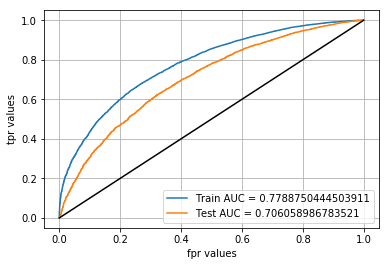

Results of analysis using Bag of words vectorized text features merged with other features using random forest classifier: 
Optimal n_estimators Value:  700
Optimal max_depth Value:  12
AUC value of test data:  0.706058986783521
Confusion Matrix : 


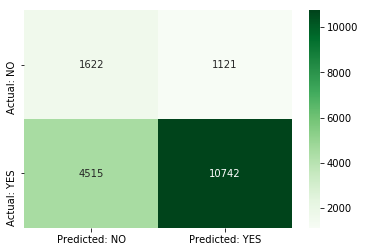

In [0]:
techniques = ['Bag of words'];
for index, technique in enumerate(techniques):
    trainingMergedData = hstack((categoriesVectorsSub,\
                                     subCategoriesVectorsSub,\
                                     teacherPrefixVectorsSub,\
                                     schoolStateVectorsSub,\
                                     projectGradeVectorsSub,\
                                     priceStandardizedSub,\
                                     previouslyPostedStandardizedSub));
    crossValidateMergedData = hstack((categoriesTransformedCrossValidateData,\
                                          subCategoriesTransformedCrossValidateData,\
                                          teacherPrefixTransformedCrossValidateData,\
                                          schoolStateTransformedCrossValidateData,\
                                          projectGradeTransformedCrossValidateData,\
                                          priceTransformedCrossValidateData,\
                                          previouslyPostedTransformedCrossValidateData));
    testMergedData = hstack((categoriesTransformedTestData,\
                                          subCategoriesTransformedTestData,\
                                          teacherPrefixTransformedTestData,\
                                          schoolStateTransformedTestData,\
                                          projectGradeTransformedTestData,\
                                          priceTransformedTestData,\
                                          previouslyPostedTransformedTestData));
    if(index == 0):
        trainingMergedData = hstack((trainingMergedData,\
                                     bowTitleModelSub,\
                                     bowEssayModelSub));
        crossValidateMergedData = hstack((crossValidateMergedData,\
                                 bowTitleTransformedCrossValidateData,\
                                 bowEssayTransformedCrossValidateData));
        testMergedData = hstack((testMergedData,\
                                 bowTitleTransformedTestData,\
                                 bowEssayTransformedTestData));
    trainingLength = trainingMergedData.shape[0];
    crossValidationLength = crossValidateMergedData.shape[0];
    totalLength = trainingLength+crossValidationLength;
    classesTrainingSub = np.concatenate((classesTraining.values, classesCrossValidate.values));
        
    trainingAndCrossValidateMergedData = vstack((trainingMergedData, crossValidateMergedData));
    rfClassifier = RandomForestClassifier(class_weight="balanced", n_jobs = -1, min_samples_split = 500);
    tunedParameters = {'n_estimators': [100, 250, 400, 500, 700], 'max_depth': [5, 8, 10, 12]};

   
      
    classifier = GridSearchCV(rfClassifier, tunedParameters, cv = 3, scoring = 'roc_auc', n_jobs = -1);
    classifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    
    crossValidateAucMeanValues = classifier.cv_results_['mean_test_score'];
    crossValidateAucStdValues = classifier.cv_results_['std_test_score'];
    
    trace1 = go.Scatter3d(x = tunedParameters['n_estimators'], y = tunedParameters['max_depth'], z = crossValidateAucMeanValues, name = 'Cross-Validate');
    data = [trace1];

    layout = go.Layout(scene = dict(
            xaxis = dict(title='n_estimators'),
            yaxis = dict(title='max_depth'),
            zaxis = dict(title='AUC'),))
    
    fig = go.Figure(data=data, layout=layout)
    configure_plotly_browser_state()
    offline.iplot(fig, filename='3d-scatter-colorscale')
    
    optimalHypParamValue = classifier.best_params_['n_estimators'];
    optimalHypParam2Value = classifier.best_params_['max_depth'];
    rfClassifier = RandomForestClassifier(class_weight = 'balanced', n_estimators = optimalHypParamValue, max_depth = optimalHypParam2Value, n_jobs = -1,  min_samples_split = 500);
    rfClassifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    predScoresTraining = rfClassifier.predict_proba(trainingAndCrossValidateMergedData);
    fprTrain, tprTrain, thresholdTrain = roc_curve(classesTrainingSub, predScoresTraining[:, 1]);
    predScoresTest = rfClassifier.predict_proba(testMergedData);
    fprTest, tprTest, thresholdTest = roc_curve(classesTest, predScoresTest[:, 1]);
    predictionClassesTest = rfClassifier.predict(testMergedData);
    
    equalsBorder(70);
    plt.plot(fprTrain, tprTrain, label = "Train AUC = " + str(auc(fprTrain, tprTrain)));
    plt.plot(fprTest, tprTest, label = "Test AUC = " + str(auc(fprTest, tprTest)));
    plt.plot([0, 1], [0, 1], 'k-');
    plt.xlabel("fpr values");
    plt.ylabel("tpr values");
    plt.grid();
    plt.legend();
    plt.show();

    areaUnderRocValueTest = auc(fprTest, tprTest);

    print("Results of analysis using {} vectorized text features merged with other features using random forest classifier: ".format(technique));
    equalsBorder(70);
    print("Optimal n_estimators Value: ", optimalHypParamValue);
    equalsBorder(40);
    print("Optimal max_depth Value: ", optimalHypParam2Value);
    equalsBorder(40);
    print("AUC value of test data: ", str(areaUnderRocValueTest));
    # Predicting classes of test data projects
    predictionClassesTest = rfClassifier.predict(testMergedData);
    equalsBorder(40);
    # Printing confusion matrix
    confusionMatrix = confusion_matrix(classesTest, predictionClassesTest);
    # Creating dataframe for generated confusion matrix
    confusionMatrixDataFrame = pd.DataFrame(data = confusionMatrix, index = ['Actual: NO', 'Actual: YES'], columns = ['Predicted: NO', 'Predicted: YES']);
    print("Confusion Matrix : ");
    equalsBorder(60);
    sbrn.heatmap(confusionMatrixDataFrame, annot = True, fmt = 'd', cmap="Greens");
    plt.show();

Cross-validation curve: 


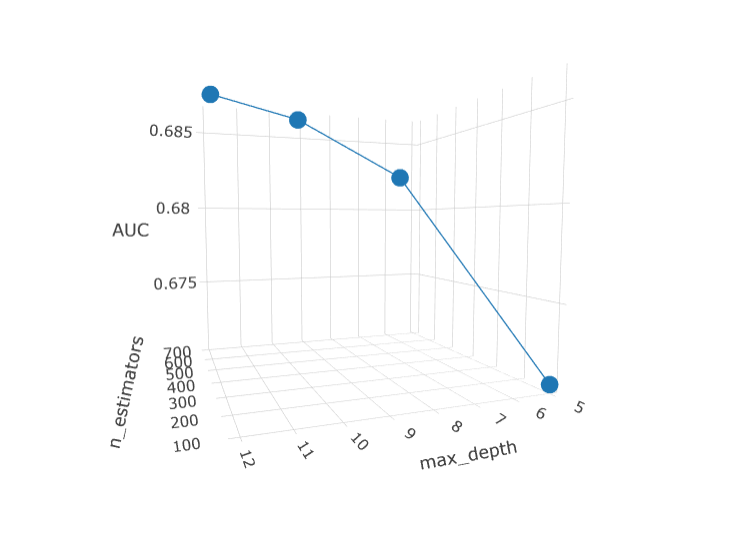

In [17]:
print("Cross-validation curve: ");
print("="*40);
display(Image(filename = "Random Forests - Bag of words.png", unconfined = True, width = '450px'));

<h3><font color="green">Classification using tf-idf vectorized data by random forests</font></h3>

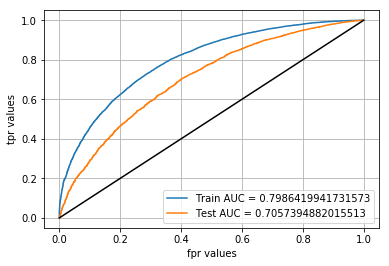

Results of analysis using Tf-Idf vectorized text features merged with other features using random forest classifier: 
Optimal n_estimators Value:  250
Optimal max_depth Value:  12
AUC value of test data:  0.7057394882015513
Confusion Matrix : 


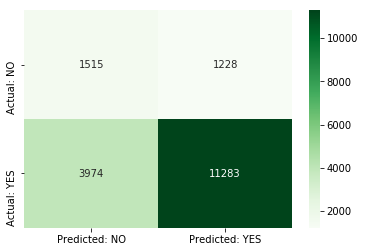

In [0]:
techniques = ['Tf-Idf'];
for index, technique in enumerate(techniques):
    trainingMergedData = hstack((categoriesVectorsSub,\
                                     subCategoriesVectorsSub,\
                                     teacherPrefixVectorsSub,\
                                     schoolStateVectorsSub,\
                                     projectGradeVectorsSub,\
                                     priceStandardizedSub,\
                                     previouslyPostedStandardizedSub));
    crossValidateMergedData = hstack((categoriesTransformedCrossValidateData,\
                                          subCategoriesTransformedCrossValidateData,\
                                          teacherPrefixTransformedCrossValidateData,\
                                          schoolStateTransformedCrossValidateData,\
                                          projectGradeTransformedCrossValidateData,\
                                          priceTransformedCrossValidateData,\
                                          previouslyPostedTransformedCrossValidateData));
    testMergedData = hstack((categoriesTransformedTestData,\
                                          subCategoriesTransformedTestData,\
                                          teacherPrefixTransformedTestData,\
                                          schoolStateTransformedTestData,\
                                          projectGradeTransformedTestData,\
                                          priceTransformedTestData,\
                                          previouslyPostedTransformedTestData));
    if(index == 0):
        trainingMergedData = hstack((trainingMergedData,\
                                     tfIdfTitleModelSub,\
                                     tfIdfEssayModelSub));
        crossValidateMergedData = hstack((crossValidateMergedData,\
                                 tfIdfTitleTransformedCrossValidateData,\
                                 tfIdfEssayTransformedCrossValidateData));
        testMergedData = hstack((testMergedData,\
                                 tfIdfTitleTransformedTestData,\
                                 tfIdfEssayTransformedTestData));
    
    trainingLength = trainingMergedData.shape[0];
    crossValidationLength = crossValidateMergedData.shape[0];
    totalLength = trainingLength+crossValidationLength;
    classesTrainingSub = np.concatenate((classesTraining.values, classesCrossValidate.values));
        
    trainingAndCrossValidateMergedData = vstack((trainingMergedData, crossValidateMergedData));
    rfClassifier = RandomForestClassifier(class_weight="balanced", n_jobs = -1, min_samples_split = 500);
    tunedParameters = {'n_estimators': [100, 250, 400, 500, 700], 'max_depth': [5, 8, 10, 12]};

    customCVIterator = []
    for i in range(3):
      trainIndices = np.arange(trainingLength);
      testIndices = random.sample(range(trainingLength, totalLength), 5000);
      customCVIterator.append( (trainIndices, testIndices) )
   
      
    classifier = GridSearchCV(rfClassifier, tunedParameters, cv = 3, scoring = 'roc_auc', n_jobs = -1);
    classifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    
    crossValidateAucMeanValues = classifier.cv_results_['mean_test_score'];
    crossValidateAucStdValues = classifier.cv_results_['std_test_score'];
    
    trace1 = go.Scatter3d(x = tunedParameters['n_estimators'], y = tunedParameters['max_depth'], z = crossValidateAucMeanValues, name = 'Cross-Validate');
    data = [trace1];

    layout = go.Layout(scene = dict(
            xaxis = dict(title='n_estimators'),
            yaxis = dict(title='max_depth'),
            zaxis = dict(title='AUC'),))
    
    fig = go.Figure(data=data, layout=layout)
    configure_plotly_browser_state()
    offline.iplot(fig, filename='3d-scatter-colorscale')
    
    optimalHypParamValue = classifier.best_params_['n_estimators'];
    optimalHypParam2Value = classifier.best_params_['max_depth'];
    rfClassifier = RandomForestClassifier(class_weight = 'balanced', n_estimators = optimalHypParamValue, max_depth = optimalHypParam2Value, n_jobs = -1,  min_samples_split = 500);
    rfClassifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    predScoresTraining = rfClassifier.predict_proba(trainingAndCrossValidateMergedData);
    fprTrain, tprTrain, thresholdTrain = roc_curve(classesTrainingSub, predScoresTraining[:, 1]);
    predScoresTest = rfClassifier.predict_proba(testMergedData);
    fprTest, tprTest, thresholdTest = roc_curve(classesTest, predScoresTest[:, 1]);
    predictionClassesTest = rfClassifier.predict(testMergedData);
    
    equalsBorder(70);
    plt.plot(fprTrain, tprTrain, label = "Train AUC = " + str(auc(fprTrain, tprTrain)));
    plt.plot(fprTest, tprTest, label = "Test AUC = " + str(auc(fprTest, tprTest)));
    plt.plot([0, 1], [0, 1], 'k-');
    plt.xlabel("fpr values");
    plt.ylabel("tpr values");
    plt.grid();
    plt.legend();
    plt.show();

    areaUnderRocValueTest = auc(fprTest, tprTest);

    print("Results of analysis using {} vectorized text features merged with other features using random forest classifier: ".format(technique));
    equalsBorder(70);
    print("Optimal n_estimators Value: ", optimalHypParamValue);
    equalsBorder(40);
    print("Optimal max_depth Value: ", optimalHypParam2Value);
    equalsBorder(40);
    print("AUC value of test data: ", str(areaUnderRocValueTest));
    # Predicting classes of test data projects
    predictionClassesTest = rfClassifier.predict(testMergedData);
    equalsBorder(40);
    # Printing confusion matrix
    confusionMatrix = confusion_matrix(classesTest, predictionClassesTest);
    # Creating dataframe for generated confusion matrix
    confusionMatrixDataFrame = pd.DataFrame(data = confusionMatrix, index = ['Actual: NO', 'Actual: YES'], columns = ['Predicted: NO', 'Predicted: YES']);
    print("Confusion Matrix : ");
    equalsBorder(60);
    sbrn.heatmap(confusionMatrixDataFrame, annot = True, fmt = 'd', cmap="Greens");
    plt.show();

Cross-validation curve: 


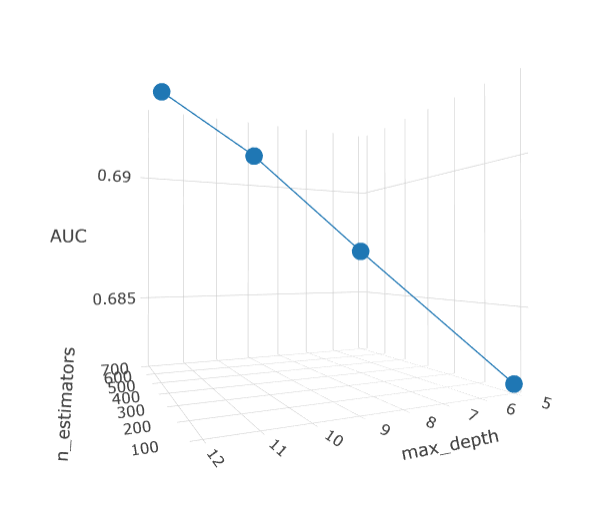

In [9]:
print("Cross-validation curve: ");
print("="*40);
display(Image(filename = "Random Forests - Tf-Idf.png", unconfined = True, width = '450px'));

<h3><font color="green">Classification using word2vec vectorized data by random forests</font></h3>

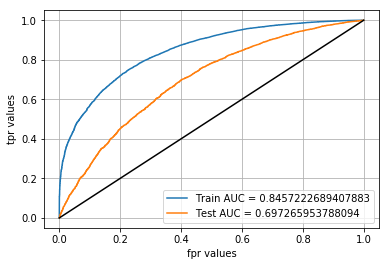

Results of analysis using Average Word2Vec vectorized text features merged with other features using random forest classifier: 
Optimal n_estimators Value:  700
Optimal max_depth Value:  12
AUC value of test data:  0.697265953788094
Confusion Matrix : 


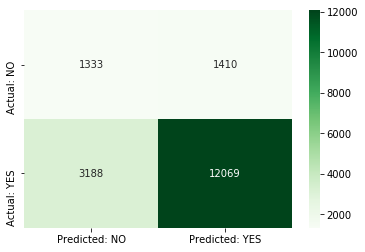

In [0]:
techniques = ['Average Word2Vec'];
for index, technique in enumerate(techniques):
    trainingMergedData = hstack((categoriesVectorsSub,\
                                     subCategoriesVectorsSub,\
                                     teacherPrefixVectorsSub,\
                                     schoolStateVectorsSub,\
                                     projectGradeVectorsSub,\
                                     priceStandardizedSub,\
                                     previouslyPostedStandardizedSub));
    crossValidateMergedData = hstack((categoriesTransformedCrossValidateData,\
                                          subCategoriesTransformedCrossValidateData,\
                                          teacherPrefixTransformedCrossValidateData,\
                                          schoolStateTransformedCrossValidateData,\
                                          projectGradeTransformedCrossValidateData,\
                                          priceTransformedCrossValidateData,\
                                          previouslyPostedTransformedCrossValidateData));
    testMergedData = hstack((categoriesTransformedTestData,\
                                          subCategoriesTransformedTestData,\
                                          teacherPrefixTransformedTestData,\
                                          schoolStateTransformedTestData,\
                                          projectGradeTransformedTestData,\
                                          priceTransformedTestData,\
                                          previouslyPostedTransformedTestData));
    if(index == 0):
        trainingMergedData = hstack((trainingMergedData,\
                                     word2VecTitlesVectors,\
                                     word2VecEssaysVectors));
        crossValidateMergedData = hstack((crossValidateMergedData,\
                                 avgWord2VecTitleTransformedCrossValidateData,\
                                 avgWord2VecEssayTransformedCrossValidateData));
        testMergedData = hstack((testMergedData,\
                                 avgWord2VecTitleTransformedTestData,\
                                 avgWord2VecEssayTransformedTestData));
    
    trainingLength = trainingMergedData.shape[0];
    crossValidationLength = crossValidateMergedData.shape[0];
    totalLength = trainingLength+crossValidationLength;
    classesTrainingSub = np.concatenate((classesTraining.values, classesCrossValidate.values));
        
    trainingAndCrossValidateMergedData = vstack((trainingMergedData, crossValidateMergedData));
    rfClassifier = RandomForestClassifier(class_weight="balanced", n_jobs = -1, min_samples_split = 500);
    tunedParameters = {'n_estimators': [100, 250, 400, 500, 700], 'max_depth': [5, 8, 10, 12, 15]};

    customCVIterator = []
    for i in range(3):
      trainIndices = np.arange(trainingLength);
      testIndices = random.sample(range(trainingLength, totalLength), 5000);
      customCVIterator.append( (trainIndices, testIndices) )
   
      
    classifier = GridSearchCV(rfClassifier, tunedParameters, cv = 3, scoring = 'roc_auc', n_jobs = -1);
    classifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    
    crossValidateAucMeanValues = classifier.cv_results_['mean_test_score'];
    crossValidateAucStdValues = classifier.cv_results_['std_test_score'];
    
    trace1 = go.Scatter3d(x = tunedParameters['n_estimators'], y = tunedParameters['max_depth'], z = crossValidateAucMeanValues, name = 'Cross-Validate');
    data = [trace1];

    layout = go.Layout(scene = dict(
            xaxis = dict(title='n_estimators'),
            yaxis = dict(title='max_depth'),
            zaxis = dict(title='AUC'),))
    
    fig = go.Figure(data=data, layout=layout)
    configure_plotly_browser_state()
    offline.iplot(fig, filename='3d-scatter-colorscale')
    
    optimalHypParamValue = classifier.best_params_['n_estimators'];
    optimalHypParam2Value = classifier.best_params_['max_depth'];
    rfClassifier = RandomForestClassifier(class_weight = 'balanced', n_estimators = optimalHypParamValue, max_depth = optimalHypParam2Value, n_jobs = -1,  min_samples_split = 500);
    rfClassifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    predScoresTraining = rfClassifier.predict_proba(trainingAndCrossValidateMergedData);
    fprTrain, tprTrain, thresholdTrain = roc_curve(classesTrainingSub, predScoresTraining[:, 1]);
    predScoresTest = rfClassifier.predict_proba(testMergedData);
    fprTest, tprTest, thresholdTest = roc_curve(classesTest, predScoresTest[:, 1]);
    predictionClassesTest = rfClassifier.predict(testMergedData);
    
    equalsBorder(70);
    plt.plot(fprTrain, tprTrain, label = "Train AUC = " + str(auc(fprTrain, tprTrain)));
    plt.plot(fprTest, tprTest, label = "Test AUC = " + str(auc(fprTest, tprTest)));
    plt.plot([0, 1], [0, 1], 'k-');
    plt.xlabel("fpr values");
    plt.ylabel("tpr values");
    plt.grid();
    plt.legend();
    plt.show();

    areaUnderRocValueTest = auc(fprTest, tprTest);

    print("Results of analysis using {} vectorized text features merged with other features using random forest classifier: ".format(technique));
    equalsBorder(70);
    print("Optimal n_estimators Value: ", optimalHypParamValue);
    equalsBorder(40);
    print("Optimal max_depth Value: ", optimalHypParam2Value);
    equalsBorder(40);
    print("AUC value of test data: ", str(areaUnderRocValueTest));
    # Predicting classes of test data projects
    predictionClassesTest = rfClassifier.predict(testMergedData);
    equalsBorder(40);
    # Printing confusion matrix
    confusionMatrix = confusion_matrix(classesTest, predictionClassesTest);
    # Creating dataframe for generated confusion matrix
    confusionMatrixDataFrame = pd.DataFrame(data = confusionMatrix, index = ['Actual: NO', 'Actual: YES'], columns = ['Predicted: NO', 'Predicted: YES']);
    print("Confusion Matrix : ");
    equalsBorder(60);
    sbrn.heatmap(confusionMatrixDataFrame, annot = True, fmt = 'd', cmap="Greens");
    plt.show();

Cross-validation curve: 


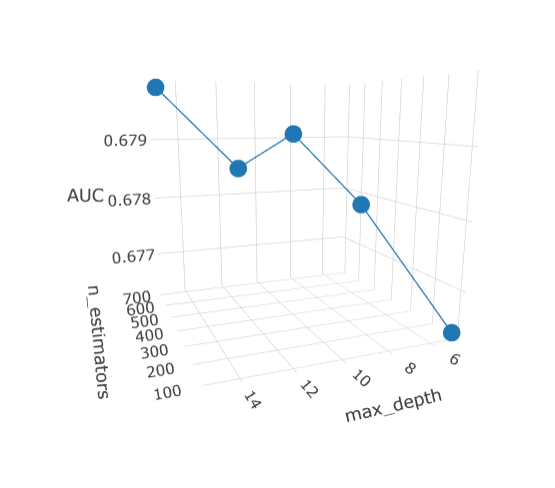

In [11]:
print("Cross-validation curve: ");
print("="*40);
display(Image(filename = "Random Forests - Average word2Vec.png", unconfined = True, width = '450px'));

<h3><font color="green">Classification using tf-idf weighted word2vec vectorized data by random forests</font></h3>

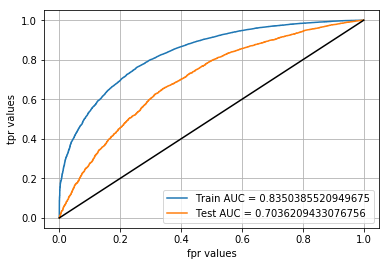

Results of analysis using Tf-Idf Weighted Word2Vec vectorized text features merged with other features using random forest classifier: 
Optimal n_estimators Value:  700
Optimal max_depth Value:  12
AUC value of test data:  0.7036209433076756
Confusion Matrix : 


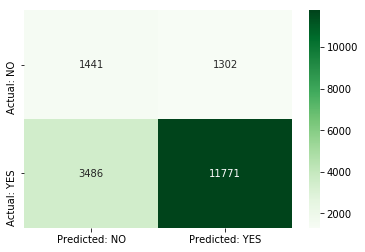

In [0]:
techniques = ['Tf-Idf Weighted Word2Vec'];
for index, technique in enumerate(techniques):
    trainingMergedData = hstack((categoriesVectorsSub,\
                                     subCategoriesVectorsSub,\
                                     teacherPrefixVectorsSub,\
                                     schoolStateVectorsSub,\
                                     projectGradeVectorsSub,\
                                     priceStandardizedSub,\
                                     previouslyPostedStandardizedSub));
    crossValidateMergedData = hstack((categoriesTransformedCrossValidateData,\
                                          subCategoriesTransformedCrossValidateData,\
                                          teacherPrefixTransformedCrossValidateData,\
                                          schoolStateTransformedCrossValidateData,\
                                          projectGradeTransformedCrossValidateData,\
                                          priceTransformedCrossValidateData,\
                                          previouslyPostedTransformedCrossValidateData));
    testMergedData = hstack((categoriesTransformedTestData,\
                                          subCategoriesTransformedTestData,\
                                          teacherPrefixTransformedTestData,\
                                          schoolStateTransformedTestData,\
                                          projectGradeTransformedTestData,\
                                          priceTransformedTestData,\
                                          previouslyPostedTransformedTestData));
    if(index == 0):
        trainingMergedData = hstack((trainingMergedData,\
                                     tfIdfWeightedWord2VecTitlesVectors,\
                                     tfIdfWeightedWord2VecEssaysVectors));
        crossValidateMergedData = hstack((crossValidateMergedData,\
                                 tfIdfWeightedWord2VecTitleTransformedCrossValidateData,\
                                 tfIdfWeightedWord2VecEssayTransformedCrossValidateData));
        testMergedData = hstack((testMergedData,\
                                 tfIdfWeightedWord2VecTitleTransformedTestData,\
                                 tfIdfWeightedWord2VecEssayTransformedTestData));
    
    trainingLength = trainingMergedData.shape[0];
    crossValidationLength = crossValidateMergedData.shape[0];
    totalLength = trainingLength+crossValidationLength;
    classesTrainingSub = np.concatenate((classesTraining.values, classesCrossValidate.values));
        
    trainingAndCrossValidateMergedData = vstack((trainingMergedData, crossValidateMergedData));
    rfClassifier = RandomForestClassifier(class_weight="balanced", n_jobs = -1, min_samples_split = 500);
    tunedParameters = {'n_estimators': [100, 250, 400, 500, 700], 'max_depth': [5, 8, 10, 12]};
   
      
    classifier = GridSearchCV(rfClassifier, tunedParameters, cv = 3, scoring = 'roc_auc', n_jobs = -1);
    classifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    
    crossValidateAucMeanValues = classifier.cv_results_['mean_test_score'];
    crossValidateAucStdValues = classifier.cv_results_['std_test_score'];
    
    trace1 = go.Scatter3d(x = tunedParameters['n_estimators'], y = tunedParameters['max_depth'], z = crossValidateAucMeanValues, name = 'Cross-Validate');
    data = [trace1];

    layout = go.Layout(scene = dict(
            xaxis = dict(title='n_estimators'),
            yaxis = dict(title='max_depth'),
            zaxis = dict(title='AUC'),))
    
    fig = go.Figure(data=data, layout=layout)
    configure_plotly_browser_state()
    offline.iplot(fig, filename='3d-scatter-colorscale')
    
    optimalHypParamValue = classifier.best_params_['n_estimators'];
    optimalHypParam2Value = classifier.best_params_['max_depth'];
    rfClassifier = RandomForestClassifier(class_weight = 'balanced', n_estimators = optimalHypParamValue, max_depth = optimalHypParam2Value, n_jobs = -1,  min_samples_split = 500);
    rfClassifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    predScoresTraining = rfClassifier.predict_proba(trainingAndCrossValidateMergedData);
    fprTrain, tprTrain, thresholdTrain = roc_curve(classesTrainingSub, predScoresTraining[:, 1]);
    predScoresTest = rfClassifier.predict_proba(testMergedData);
    fprTest, tprTest, thresholdTest = roc_curve(classesTest, predScoresTest[:, 1]);
    predictionClassesTest = rfClassifier.predict(testMergedData);
    
    equalsBorder(70);
    plt.plot(fprTrain, tprTrain, label = "Train AUC = " + str(auc(fprTrain, tprTrain)));
    plt.plot(fprTest, tprTest, label = "Test AUC = " + str(auc(fprTest, tprTest)));
    plt.plot([0, 1], [0, 1], 'k-');
    plt.xlabel("fpr values");
    plt.ylabel("tpr values");
    plt.grid();
    plt.legend();
    plt.show();

    areaUnderRocValueTest = auc(fprTest, tprTest);

    print("Results of analysis using {} vectorized text features merged with other features using random forest classifier: ".format(technique));
    equalsBorder(70);
    print("Optimal n_estimators Value: ", optimalHypParamValue);
    equalsBorder(40);
    print("Optimal max_depth Value: ", optimalHypParam2Value);
    equalsBorder(40);
    print("AUC value of test data: ", str(areaUnderRocValueTest));
    # Predicting classes of test data projects
    predictionClassesTest = rfClassifier.predict(testMergedData);
    equalsBorder(40);
    # Printing confusion matrix
    confusionMatrix = confusion_matrix(classesTest, predictionClassesTest);
    # Creating dataframe for generated confusion matrix
    confusionMatrixDataFrame = pd.DataFrame(data = confusionMatrix, index = ['Actual: NO', 'Actual: YES'], columns = ['Predicted: NO', 'Predicted: YES']);
    print("Confusion Matrix : ");
    equalsBorder(60);
    sbrn.heatmap(confusionMatrixDataFrame, annot = True, fmt = 'd', cmap="Greens");
    plt.show();

Cross-validation curve: 


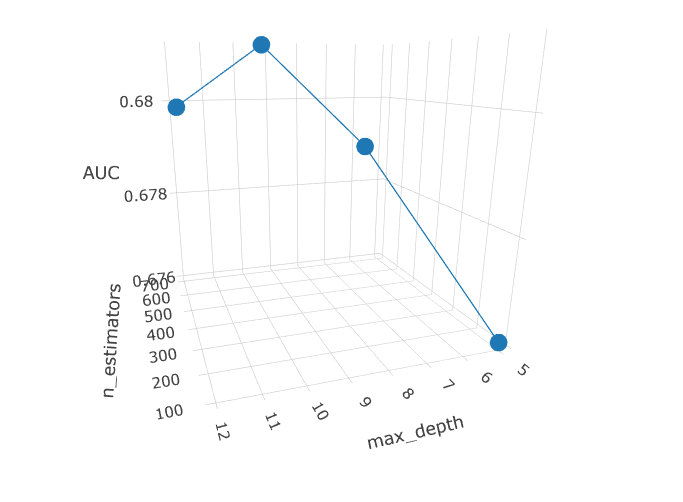

In [12]:
print("Cross-validation curve: ");
print("="*40);
display(Image(filename = "Random Forests - Tf-Idf Weighted Word2Vec.png", unconfined = True, width = '450px'));

<a id="classification_on_data_using_decision_trees"></a>
<h2><font color="green">Classification using data vectorized by various models by gradient boosting classifier</font></h2>

In [0]:
numNegative = 0;
numPositive = 0;
for classType in classesTrainingSub:
	if(classType == 0):
		numNegative += 1;
	else:
		numPositive += 1;
print(numNegative/numPositive);

0.17980842158487598


<h3><font color="green">Classification using bag of words vectorized data by gradient boosting classifier</font></h3>

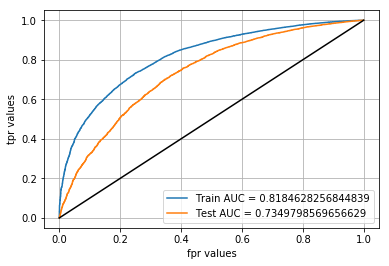

Results of analysis using Bag of words vectorized text features merged with other features using gradient boosting classifier: 
Optimal n_estimators Value:  400
Optimal max_depth Value:  3
AUC value of test data:  0.7349798569656629
Confusion Matrix : 


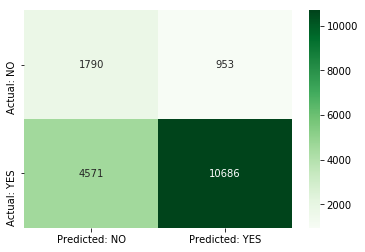

In [0]:
techniques = ['Bag of words'];
for index, technique in enumerate(techniques):
    trainingMergedData = hstack((categoriesVectorsSub,\
                                     subCategoriesVectorsSub,\
                                     teacherPrefixVectorsSub,\
                                     schoolStateVectorsSub,\
                                     projectGradeVectorsSub,\
                                     priceStandardizedSub,\
                                     previouslyPostedStandardizedSub));
    crossValidateMergedData = hstack((categoriesTransformedCrossValidateData,\
                                          subCategoriesTransformedCrossValidateData,\
                                          teacherPrefixTransformedCrossValidateData,\
                                          schoolStateTransformedCrossValidateData,\
                                          projectGradeTransformedCrossValidateData,\
                                          priceTransformedCrossValidateData,\
                                          previouslyPostedTransformedCrossValidateData));
    testMergedData = hstack((categoriesTransformedTestData,\
                                          subCategoriesTransformedTestData,\
                                          teacherPrefixTransformedTestData,\
                                          schoolStateTransformedTestData,\
                                          projectGradeTransformedTestData,\
                                          priceTransformedTestData,\
                                          previouslyPostedTransformedTestData));
    if(index == 0):
        trainingMergedData = hstack((trainingMergedData,\
                                     bowTitleModelSub,\
                                     bowEssayModelSub));
        crossValidateMergedData = hstack((crossValidateMergedData,\
                                 bowTitleTransformedCrossValidateData,\
                                 bowEssayTransformedCrossValidateData));
        testMergedData = hstack((testMergedData,\
                                 bowTitleTransformedTestData,\
                                 bowEssayTransformedTestData));
    trainingLength = trainingMergedData.shape[0];
    crossValidationLength = crossValidateMergedData.shape[0];
    totalLength = trainingLength+crossValidationLength;
    classesTrainingSub = np.concatenate((classesTraining.values, classesCrossValidate.values));
        
    trainingAndCrossValidateMergedData = vstack((trainingMergedData, crossValidateMergedData));
    gbdtClassifier = xgb.XGBClassifier(n_jobs = -1, min_samples_split = 500, reg_alpha = 1, reg_lambda = 0, subsample = 0.5, colsample_bytree = 0.5, scale_pos_weight = 0.18);
    tunedParameters = {'n_estimators': [100, 250, 400, 500, 700], 'max_depth': [1, 3, 4, 5, 7]};    
    classifier = GridSearchCV(gbdtClassifier, tunedParameters, cv = 5, scoring = 'roc_auc', n_jobs= -1);
    classifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    
    testScoresDataFrame = pd.DataFrame(data = np.hstack((classifier.cv_results_['param_n_estimators'].data[:, None], classifier.cv_results_['param_max_depth'].data[:, None], classifier.cv_results_['mean_test_score'][:, None], classifier.cv_results_['std_test_score'][:, None])), columns = ['n_estimators', 'max_depth', 'mts', 'stdts']);
    testScoresDataFrame = testScoresDataFrame.astype(float);
    
    crossValidateAucMeanValues = classifier.cv_results_['mean_test_score'];
    crossValidateAucStdValues = classifier.cv_results_['std_test_score'];
    
    trace1 = go.Scatter3d(x = tunedParameters['n_estimators'], y = tunedParameters['max_depth'], z = crossValidateAucMeanValues, name = 'Cross-Validate');
    data = [trace1];

    layout = go.Layout(scene = dict(
            xaxis = dict(title='n_estimators'),
            yaxis = dict(title='max_depth'),
            zaxis = dict(title='AUC'),))
    
    fig = go.Figure(data=data, layout=layout)
    configure_plotly_browser_state()
    offline.iplot(fig, filename='3d-scatter-colorscale')
    
    optimalHypParamValue = classifier.best_params_['n_estimators'];
    optimalHypParam2Value = classifier.best_params_['max_depth'];
    gbdtClassifier = xgb.XGBClassifier(n_estimators = optimalHypParamValue, max_depth = optimalHypParam2Value, n_jobs = -1, min_samples_split = 500, reg_alpha = 1, reg_lambda = 0, subsample = 0.5, colsample_bytree = 0.5, scale_pos_weight = 0.18);
    gbdtClassifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    predScoresTraining = gbdtClassifier.predict_proba(trainingAndCrossValidateMergedData);
    fprTrain, tprTrain, thresholdTrain = roc_curve(classesTrainingSub, predScoresTraining[:, 1]);
    predScoresTest = gbdtClassifier.predict_proba(testMergedData);
    fprTest, tprTest, thresholdTest = roc_curve(classesTest, predScoresTest[:, 1]);
    predictionClassesTest = gbdtClassifier.predict(testMergedData);
    
    equalsBorder(70);
    plt.plot(fprTrain, tprTrain, label = "Train AUC = " + str(auc(fprTrain, tprTrain)));
    plt.plot(fprTest, tprTest, label = "Test AUC = " + str(auc(fprTest, tprTest)));
    plt.plot([0, 1], [0, 1], 'k-');
    plt.xlabel("fpr values");
    plt.ylabel("tpr values");
    plt.grid();
    plt.legend();
    plt.show();

    areaUnderRocValueTest = auc(fprTest, tprTest);

    print("Results of analysis using {} vectorized text features merged with other features using gradient boosting classifier: ".format(technique));
    equalsBorder(70);
    print("Optimal n_estimators Value: ", optimalHypParamValue);
    equalsBorder(40);
    print("Optimal max_depth Value: ", optimalHypParam2Value);
    equalsBorder(40);
    print("AUC value of test data: ", str(areaUnderRocValueTest));
    # Predicting classes of test data projects
    predictionClassesTest = gbdtClassifier.predict(testMergedData);
    equalsBorder(40);
    # Printing confusion matrix
    confusionMatrix = confusion_matrix(classesTest, predictionClassesTest);
    # Creating dataframe for generated confusion matrix
    confusionMatrixDataFrame = pd.DataFrame(data = confusionMatrix, index = ['Actual: NO', 'Actual: YES'], columns = ['Predicted: NO', 'Predicted: YES']);
    print("Confusion Matrix : ");
    equalsBorder(60);
    sbrn.heatmap(confusionMatrixDataFrame, annot = True, fmt = 'd', cmap="Greens");
    plt.show();

Cross-validation curve: 


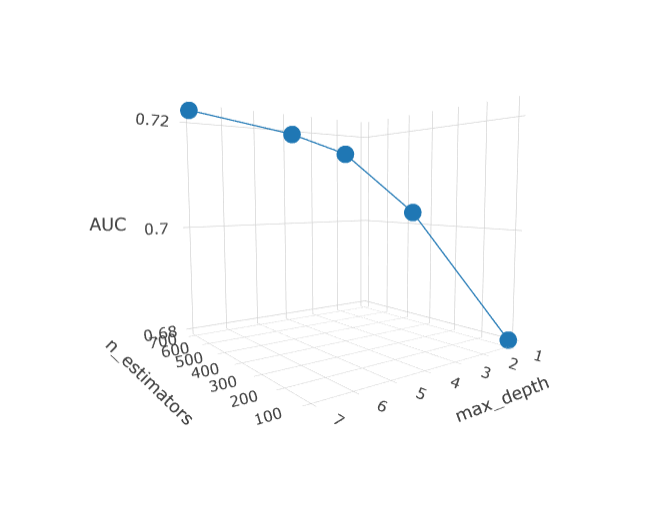

In [13]:
print("Cross-validation curve: ");
print("="*40);
display(Image(filename = "GBDT - Bag of words.png", unconfined = True, width = '450px'));

<h3><font color="green">Classification using tf-idf vectorized data by gradient boosting classifier</font></h3>

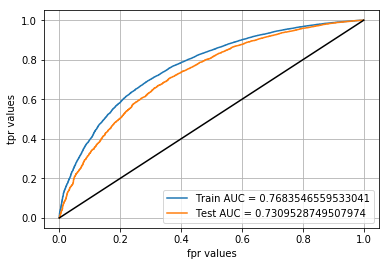

Results of analysis using Tf-Idf vectorized text features merged with other features using gradient boosting classifier: 
Optimal n_estimators Value:  700
Optimal max_depth Value:  1
AUC value of test data:  0.7309528749507974
Confusion Matrix : 


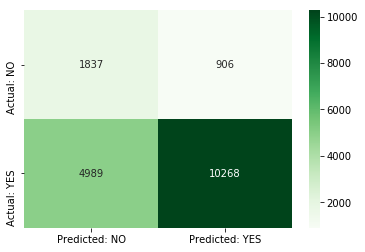

In [0]:
techniques = ['Tf-Idf'];
for index, technique in enumerate(techniques):
    trainingMergedData = hstack((categoriesVectorsSub,\
                                     subCategoriesVectorsSub,\
                                     teacherPrefixVectorsSub,\
                                     schoolStateVectorsSub,\
                                     projectGradeVectorsSub,\
                                     priceStandardizedSub,\
                                     previouslyPostedStandardizedSub));
    crossValidateMergedData = hstack((categoriesTransformedCrossValidateData,\
                                          subCategoriesTransformedCrossValidateData,\
                                          teacherPrefixTransformedCrossValidateData,\
                                          schoolStateTransformedCrossValidateData,\
                                          projectGradeTransformedCrossValidateData,\
                                          priceTransformedCrossValidateData,\
                                          previouslyPostedTransformedCrossValidateData));
    testMergedData = hstack((categoriesTransformedTestData,\
                                          subCategoriesTransformedTestData,\
                                          teacherPrefixTransformedTestData,\
                                          schoolStateTransformedTestData,\
                                          projectGradeTransformedTestData,\
                                          priceTransformedTestData,\
                                          previouslyPostedTransformedTestData));
    if(index == 0):
        trainingMergedData = hstack((trainingMergedData,\
                                     tfIdfTitleModelSub,\
                                     tfIdfEssayModelSub));
        crossValidateMergedData = hstack((crossValidateMergedData,\
                                 tfIdfTitleTransformedCrossValidateData,\
                                 tfIdfEssayTransformedCrossValidateData));
        testMergedData = hstack((testMergedData,\
                                 tfIdfTitleTransformedTestData,\
                                 tfIdfEssayTransformedTestData));
    
    trainingLength = trainingMergedData.shape[0];
    crossValidationLength = crossValidateMergedData.shape[0];
    totalLength = trainingLength+crossValidationLength;
    classesTrainingSub = np.concatenate((classesTraining.values, classesCrossValidate.values));
        
    trainingAndCrossValidateMergedData = vstack((trainingMergedData, crossValidateMergedData));
    gbdtClassifier = xgb.XGBClassifier(n_jobs = -1, min_samples_split = 500, reg_alpha = 1, reg_lambda = 0, subsample = 0.5, colsample_bytree = 0.5, scale_pos_weight = 0.18);
    tunedParameters = {'n_estimators': [100, 250, 400, 500, 700], 'max_depth': [1, 3, 4, 5, 7]};    
    classifier = GridSearchCV(gbdtClassifier, tunedParameters, cv = 5, scoring = 'roc_auc', n_jobs= -1);
    classifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    
    testScoresDataFrame = pd.DataFrame(data = np.hstack((classifier.cv_results_['param_n_estimators'].data[:, None], classifier.cv_results_['param_max_depth'].data[:, None], classifier.cv_results_['mean_test_score'][:, None], classifier.cv_results_['std_test_score'][:, None])), columns = ['n_estimators', 'max_depth', 'mts', 'stdts']);
    testScoresDataFrame = testScoresDataFrame.astype(float);
    
    crossValidateAucMeanValues = classifier.cv_results_['mean_test_score'];
    crossValidateAucStdValues = classifier.cv_results_['std_test_score'];
    
    trace1 = go.Scatter3d(x = tunedParameters['n_estimators'], y = tunedParameters['max_depth'], z = crossValidateAucMeanValues, name = 'Cross-Validate');
    data = [trace1];

    layout = go.Layout(scene = dict(
            xaxis = dict(title='n_estimators'),
            yaxis = dict(title='max_depth'),
            zaxis = dict(title='AUC'),))
    
    fig = go.Figure(data=data, layout=layout)
    configure_plotly_browser_state()
    offline.iplot(fig, filename='3d-scatter-colorscale')
    
    optimalHypParamValue = classifier.best_params_['n_estimators'];
    optimalHypParam2Value = classifier.best_params_['max_depth'];
    gbdtClassifier = xgb.XGBClassifier(n_estimators = optimalHypParamValue, max_depth = optimalHypParam2Value, n_jobs = -1, min_samples_split = 500, reg_alpha = 1, reg_lambda = 0, subsample = 0.5, colsample_bytree = 0.5, scale_pos_weight = 0.18);
    gbdtClassifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    predScoresTraining = gbdtClassifier.predict_proba(trainingAndCrossValidateMergedData);
    fprTrain, tprTrain, thresholdTrain = roc_curve(classesTrainingSub, predScoresTraining[:, 1]);
    predScoresTest = gbdtClassifier.predict_proba(testMergedData);
    fprTest, tprTest, thresholdTest = roc_curve(classesTest, predScoresTest[:, 1]);
    predictionClassesTest = gbdtClassifier.predict(testMergedData);
    
    equalsBorder(70);
    plt.plot(fprTrain, tprTrain, label = "Train AUC = " + str(auc(fprTrain, tprTrain)));
    plt.plot(fprTest, tprTest, label = "Test AUC = " + str(auc(fprTest, tprTest)));
    plt.plot([0, 1], [0, 1], 'k-');
    plt.xlabel("fpr values");
    plt.ylabel("tpr values");
    plt.grid();
    plt.legend();
    plt.show();

    areaUnderRocValueTest = auc(fprTest, tprTest);

    print("Results of analysis using {} vectorized text features merged with other features using gradient boosting classifier: ".format(technique));
    equalsBorder(70);
    print("Optimal n_estimators Value: ", optimalHypParamValue);
    equalsBorder(40);
    print("Optimal max_depth Value: ", optimalHypParam2Value);
    equalsBorder(40);
    print("AUC value of test data: ", str(areaUnderRocValueTest));
    # Predicting classes of test data projects
    predictionClassesTest = gbdtClassifier.predict(testMergedData);
    equalsBorder(40);
    # Printing confusion matrix
    confusionMatrix = confusion_matrix(classesTest, predictionClassesTest);
    # Creating dataframe for generated confusion matrix
    confusionMatrixDataFrame = pd.DataFrame(data = confusionMatrix, index = ['Actual: NO', 'Actual: YES'], columns = ['Predicted: NO', 'Predicted: YES']);
    print("Confusion Matrix : ");
    equalsBorder(60);
    sbrn.heatmap(confusionMatrixDataFrame, annot = True, fmt = 'd', cmap="Greens");
    plt.show();

Cross-validation curve: 


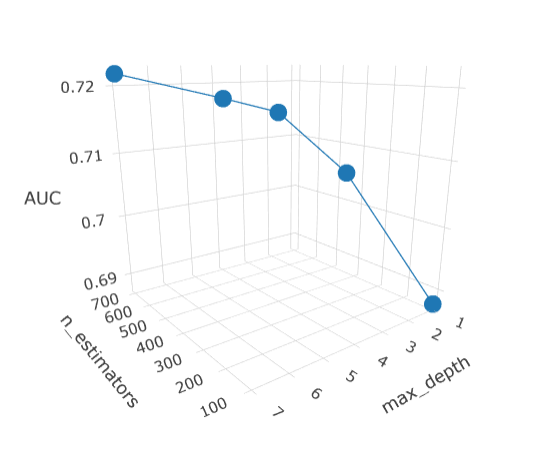

In [14]:
print("Cross-validation curve: ");
print("="*40);
display(Image(filename = "GBDT - Tf-Idf.png", unconfined = True, width = '450px'));

<h3><font color="green">Classification using word2vec vectorized data by gradient boosting classifier</font></h3>

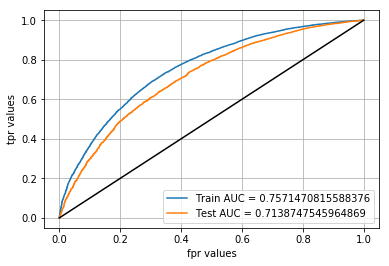

Results of analysis using Average Word2Vec vectorized text features merged with other features using gradient boosting classifier: 
Optimal n_estimators Value:  700
Optimal max_depth Value:  1
AUC value of test data:  0.7138747545964869
Confusion Matrix : 


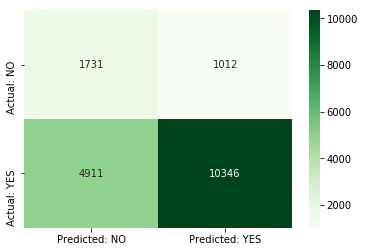

In [0]:
techniques = ['Average Word2Vec'];
for index, technique in enumerate(techniques):
    trainingMergedData = hstack((categoriesVectorsSub,\
                                     subCategoriesVectorsSub,\
                                     teacherPrefixVectorsSub,\
                                     schoolStateVectorsSub,\
                                     projectGradeVectorsSub,\
                                     priceStandardizedSub,\
                                     previouslyPostedStandardizedSub));
    crossValidateMergedData = hstack((categoriesTransformedCrossValidateData,\
                                          subCategoriesTransformedCrossValidateData,\
                                          teacherPrefixTransformedCrossValidateData,\
                                          schoolStateTransformedCrossValidateData,\
                                          projectGradeTransformedCrossValidateData,\
                                          priceTransformedCrossValidateData,\
                                          previouslyPostedTransformedCrossValidateData));
    testMergedData = hstack((categoriesTransformedTestData,\
                                          subCategoriesTransformedTestData,\
                                          teacherPrefixTransformedTestData,\
                                          schoolStateTransformedTestData,\
                                          projectGradeTransformedTestData,\
                                          priceTransformedTestData,\
                                          previouslyPostedTransformedTestData));
    if(index == 0):
        trainingMergedData = hstack((trainingMergedData,\
                                     word2VecTitlesVectors,\
                                     word2VecEssaysVectors));
        crossValidateMergedData = hstack((crossValidateMergedData,\
                                 avgWord2VecTitleTransformedCrossValidateData,\
                                 avgWord2VecEssayTransformedCrossValidateData));
        testMergedData = hstack((testMergedData,\
                                 avgWord2VecTitleTransformedTestData,\
                                 avgWord2VecEssayTransformedTestData));
    
    trainingLength = trainingMergedData.shape[0];
    crossValidationLength = crossValidateMergedData.shape[0];
    totalLength = trainingLength+crossValidationLength;
    classesTrainingSub = np.concatenate((classesTraining.values, classesCrossValidate.values));
        
    trainingAndCrossValidateMergedData = vstack((trainingMergedData, crossValidateMergedData));
    gbdtClassifier = xgb.XGBClassifier(n_jobs = -1, min_samples_split = 500, reg_alpha = 1, reg_lambda = 0, subsample = 0.5, colsample_bytree = 0.5, scale_pos_weight = 0.18);
    tunedParameters = {'n_estimators': [100, 250, 400, 500, 700], 'max_depth': [1, 3, 4, 5, 7]};    
    classifier = GridSearchCV(gbdtClassifier, tunedParameters, cv = 5, scoring = 'roc_auc', n_jobs= -1);
    classifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    
    testScoresDataFrame = pd.DataFrame(data = np.hstack((classifier.cv_results_['param_n_estimators'].data[:, None], classifier.cv_results_['param_max_depth'].data[:, None], classifier.cv_results_['mean_test_score'][:, None], classifier.cv_results_['std_test_score'][:, None])), columns = ['n_estimators', 'max_depth', 'mts', 'stdts']);
    testScoresDataFrame = testScoresDataFrame.astype(float);
    
    crossValidateAucMeanValues = classifier.cv_results_['mean_test_score'];
    crossValidateAucStdValues = classifier.cv_results_['std_test_score'];
    
    trace1 = go.Scatter3d(x = tunedParameters['n_estimators'], y = tunedParameters['max_depth'], z = crossValidateAucMeanValues, name = 'Cross-Validate');
    data = [trace1];

    layout = go.Layout(scene = dict(
            xaxis = dict(title='n_estimators'),
            yaxis = dict(title='max_depth'),
            zaxis = dict(title='AUC'),))
    
    fig = go.Figure(data=data, layout=layout)
    configure_plotly_browser_state()
    offline.iplot(fig, filename='3d-scatter-colorscale')
    
    optimalHypParamValue = classifier.best_params_['n_estimators'];
    optimalHypParam2Value = classifier.best_params_['max_depth'];
    gbdtClassifier = xgb.XGBClassifier(n_estimators = optimalHypParamValue, max_depth = optimalHypParam2Value, n_jobs = -1, min_samples_split = 500, reg_alpha = 1, reg_lambda = 0, subsample = 0.5, colsample_bytree = 0.5, scale_pos_weight = 0.18);
    gbdtClassifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    predScoresTraining = gbdtClassifier.predict_proba(trainingAndCrossValidateMergedData);
    fprTrain, tprTrain, thresholdTrain = roc_curve(classesTrainingSub, predScoresTraining[:, 1]);
    predScoresTest = gbdtClassifier.predict_proba(testMergedData);
    fprTest, tprTest, thresholdTest = roc_curve(classesTest, predScoresTest[:, 1]);
    predictionClassesTest = gbdtClassifier.predict(testMergedData);
    
    equalsBorder(70);
    plt.plot(fprTrain, tprTrain, label = "Train AUC = " + str(auc(fprTrain, tprTrain)));
    plt.plot(fprTest, tprTest, label = "Test AUC = " + str(auc(fprTest, tprTest)));
    plt.plot([0, 1], [0, 1], 'k-');
    plt.xlabel("fpr values");
    plt.ylabel("tpr values");
    plt.grid();
    plt.legend();
    plt.show();

    areaUnderRocValueTest = auc(fprTest, tprTest);

    print("Results of analysis using {} vectorized text features merged with other features using gradient boosting classifier: ".format(technique));
    equalsBorder(70);
    print("Optimal n_estimators Value: ", optimalHypParamValue);
    equalsBorder(40);
    print("Optimal max_depth Value: ", optimalHypParam2Value);
    equalsBorder(40);
    print("AUC value of test data: ", str(areaUnderRocValueTest));
    # Predicting classes of test data projects
    predictionClassesTest = gbdtClassifier.predict(testMergedData);
    equalsBorder(40);
    # Printing confusion matrix
    confusionMatrix = confusion_matrix(classesTest, predictionClassesTest);
    # Creating dataframe for generated confusion matrix
    confusionMatrixDataFrame = pd.DataFrame(data = confusionMatrix, index = ['Actual: NO', 'Actual: YES'], columns = ['Predicted: NO', 'Predicted: YES']);
    print("Confusion Matrix : ");
    equalsBorder(60);
    sbrn.heatmap(confusionMatrixDataFrame, annot = True, fmt = 'd', cmap="Greens");
    plt.show();

Cross-validation curve: 


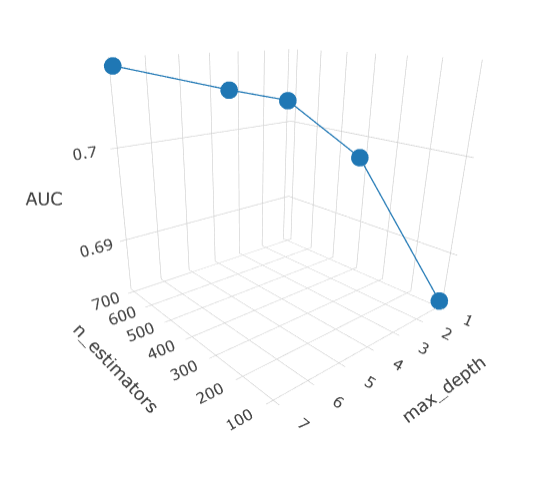

In [15]:
print("Cross-validation curve: ");
print("="*40);
display(Image(filename = "GBDT - Average Word2Vec.png", unconfined = True, width = '450px'));

<h3><font color="green">Classification using tf-idf weighted word2vec vectorized data by gradient boosting classifier</font></h3>

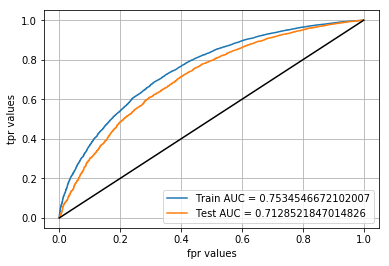

Results of analysis using Tf-Idf Weighted Word2Vec vectorized text features merged with other features using gradient boosting classifier: 
Optimal n_estimators Value:  700
Optimal max_depth Value:  1
AUC value of test data:  0.7128521847014826
Confusion Matrix : 


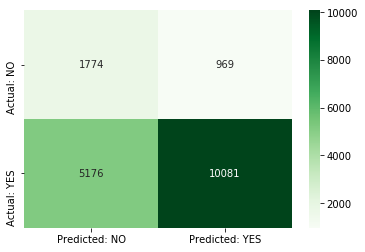

In [88]:
techniques = ['Tf-Idf Weighted Word2Vec'];
for index, technique in enumerate(techniques):
    trainingMergedData = hstack((categoriesVectorsSub,\
                                     subCategoriesVectorsSub,\
                                     teacherPrefixVectorsSub,\
                                     schoolStateVectorsSub,\
                                     projectGradeVectorsSub,\
                                     priceStandardizedSub,\
                                     previouslyPostedStandardizedSub));
    crossValidateMergedData = hstack((categoriesTransformedCrossValidateData,\
                                          subCategoriesTransformedCrossValidateData,\
                                          teacherPrefixTransformedCrossValidateData,\
                                          schoolStateTransformedCrossValidateData,\
                                          projectGradeTransformedCrossValidateData,\
                                          priceTransformedCrossValidateData,\
                                          previouslyPostedTransformedCrossValidateData));
    testMergedData = hstack((categoriesTransformedTestData,\
                                          subCategoriesTransformedTestData,\
                                          teacherPrefixTransformedTestData,\
                                          schoolStateTransformedTestData,\
                                          projectGradeTransformedTestData,\
                                          priceTransformedTestData,\
                                          previouslyPostedTransformedTestData));
    if(index == 0):
        trainingMergedData = hstack((trainingMergedData,\
                                     tfIdfWeightedWord2VecTitlesVectors,\
                                     tfIdfWeightedWord2VecEssaysVectors));
        crossValidateMergedData = hstack((crossValidateMergedData,\
                                 tfIdfWeightedWord2VecTitleTransformedCrossValidateData,\
                                 tfIdfWeightedWord2VecEssayTransformedCrossValidateData));
        testMergedData = hstack((testMergedData,\
                                 tfIdfWeightedWord2VecTitleTransformedTestData,\
                                 tfIdfWeightedWord2VecEssayTransformedTestData));
    
    trainingLength = trainingMergedData.shape[0];
    crossValidationLength = crossValidateMergedData.shape[0];
    totalLength = trainingLength+crossValidationLength;
    classesTrainingSub = np.concatenate((classesTraining.values, classesCrossValidate.values));
        
    trainingAndCrossValidateMergedData = vstack((trainingMergedData, crossValidateMergedData));
    gbdtClassifier = xgb.XGBClassifier(n_jobs = -1, min_samples_split = 500, reg_alpha = 1, reg_lambda = 0, subsample = 0.5, colsample_bytree = 0.5, scale_pos_weight = 0.18);
    tunedParameters = {'n_estimators': [100, 250, 400, 500, 700], 'max_depth': [1, 3, 4, 5, 7]};    
    classifier = GridSearchCV(gbdtClassifier, tunedParameters, cv = 5, scoring = 'roc_auc', n_jobs= -1);
    classifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    
    testScoresDataFrame = pd.DataFrame(data = np.hstack((classifier.cv_results_['param_n_estimators'].data[:, None], classifier.cv_results_['param_max_depth'].data[:, None], classifier.cv_results_['mean_test_score'][:, None], classifier.cv_results_['std_test_score'][:, None])), columns = ['n_estimators', 'max_depth', 'mts', 'stdts']);
    testScoresDataFrame = testScoresDataFrame.astype(float);
    
    crossValidateAucMeanValues = classifier.cv_results_['mean_test_score'];
    crossValidateAucStdValues = classifier.cv_results_['std_test_score'];
    
    trace1 = go.Scatter3d(x = tunedParameters['n_estimators'], y = tunedParameters['max_depth'], z = crossValidateAucMeanValues, name = 'Cross-Validate');
    data = [trace1];

    layout = go.Layout(scene = dict(
            xaxis = dict(title='n_estimators'),
            yaxis = dict(title='max_depth'),
            zaxis = dict(title='AUC'),))
    
    fig = go.Figure(data=data, layout=layout)
    configure_plotly_browser_state()
    offline.iplot(fig, filename='3d-scatter-colorscale')
    
    optimalHypParamValue = classifier.best_params_['n_estimators'];
    optimalHypParam2Value = classifier.best_params_['max_depth'];
    gbdtClassifier = xgb.XGBClassifier(n_estimators = optimalHypParamValue, max_depth = optimalHypParam2Value, n_jobs = -1, min_samples_split = 500, reg_alpha = 1, reg_lambda = 0, subsample = 0.5, colsample_bytree = 0.5, scale_pos_weight = 0.18);
    gbdtClassifier.fit(trainingAndCrossValidateMergedData, classesTrainingSub);
    predScoresTraining = gbdtClassifier.predict_proba(trainingAndCrossValidateMergedData);
    fprTrain, tprTrain, thresholdTrain = roc_curve(classesTrainingSub, predScoresTraining[:, 1]);
    predScoresTest = gbdtClassifier.predict_proba(testMergedData);
    fprTest, tprTest, thresholdTest = roc_curve(classesTest, predScoresTest[:, 1]);
    predictionClassesTest = gbdtClassifier.predict(testMergedData);
    
    equalsBorder(70);
    plt.plot(fprTrain, tprTrain, label = "Train AUC = " + str(auc(fprTrain, tprTrain)));
    plt.plot(fprTest, tprTest, label = "Test AUC = " + str(auc(fprTest, tprTest)));
    plt.plot([0, 1], [0, 1], 'k-');
    plt.xlabel("fpr values");
    plt.ylabel("tpr values");
    plt.grid();
    plt.legend();
    plt.show();

    areaUnderRocValueTest = auc(fprTest, tprTest);

    print("Results of analysis using {} vectorized text features merged with other features using gradient boosting classifier: ".format(technique));
    equalsBorder(70);
    print("Optimal n_estimators Value: ", optimalHypParamValue);
    equalsBorder(40);
    print("Optimal max_depth Value: ", optimalHypParam2Value);
    equalsBorder(40);
    print("AUC value of test data: ", str(areaUnderRocValueTest));
    # Predicting classes of test data projects
    predictionClassesTest = gbdtClassifier.predict(testMergedData);
    equalsBorder(40);
    # Printing confusion matrix
    confusionMatrix = confusion_matrix(classesTest, predictionClassesTest);
    # Creating dataframe for generated confusion matrix
    confusionMatrixDataFrame = pd.DataFrame(data = confusionMatrix, index = ['Actual: NO', 'Actual: YES'], columns = ['Predicted: NO', 'Predicted: YES']);
    print("Confusion Matrix : ");
    equalsBorder(60);
    sbrn.heatmap(confusionMatrixDataFrame, annot = True, fmt = 'd', cmap="Greens");
    plt.show();

Cross-validation curve: 


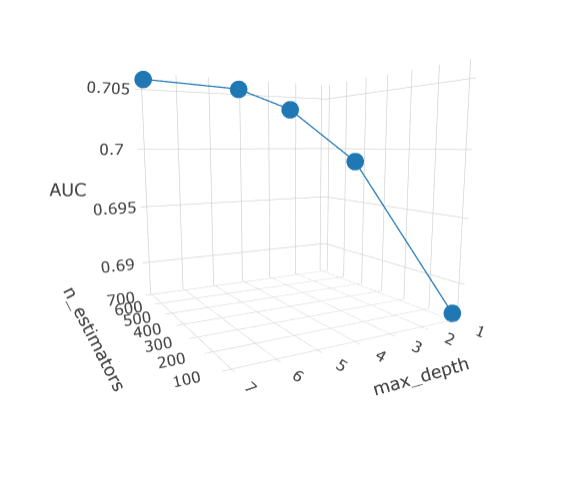

In [16]:
print("Cross-validation curve: ");
print("="*40);
display(Image(filename = "GBDT - Tf-Idf Weighted Word2Vec.png", unconfined = True, width = '450px'));

<a id="classification_using_support_vector_machine_results"></a>
<h3><font color="green">Summary of results of above classification using random forests and gradient boosting classifier</font></h3>

In [89]:
techniques = ['Bag of words', 'Tf-Idf', 'Average Word2Vec', 'Tf-Idf Weighted Word2Vec', 'Bag of words', 'Tf-Idf', 'Average Word2Vec', 'Tf-Idf Weighted Word2Vec'];
aucValues = [0.7060, 0.7057, 0.6972, 0.7036, 0.7349, 0.7309, 0.7138, 0.7128]
models = ['Random Forests', 'Random Forests', 'Random Forests', 'Random Forests', 'Gradient Boosting - DT', 'Gradient Boosting - DT', 'Gradient Boosting - DT', 'Gradient Boosting - DT'];
nEstimatorsValues = [700, 250, 700, 700, 400, 700, 700, 700]
maxDepthValues = [12, 12, 12, 12, 3, 1, 1, 1]
for i,technique in enumerate(techniques):
    randomForestsAndGbdtResultsDataFrame = randomForestsAndGbdtResultsDataFrame.append({'Vectorizer': technique, 'Model': models[i], 'Max Depth': maxDepthValues[i], 'N Estimators': nEstimatorsValues[i], 'AUC': aucValues[i]}, ignore_index = True);
randomForestsAndGbdtResultsDataFrame

,Vectorizer,Model,Max Depth,N Estimators,AUC
0,Bag of words,Random Forests,12,700,0.7060
1,Tf-Idf,Random Forests,12,250,0.7057
2,Average Word2Vec,Random Forests,12,700,0.6972
3,Tf-Idf Weighted Word2Vec,Random Forests,12,700,0.7036
4,Bag of words,Gradient Boosting - DT,3,400,0.7349
5,Tf-Idf,Gradient Boosting - DT,1,700,0.7309
6,Average Word2Vec,Gradient Boosting - DT,1,700,0.7138
7,Tf-Idf Weighted Word2Vec,Gradient Boosting - DT,1,700,0.7128


<a id="classification_using_support_vector_machine_conclusions"></a>
<h3><font color="green">Conclusions of above analysis</font></h3>

1. The model trained using gradient boosting decision trees are better than models trained using random forests as you can observe from auc values.
2. It seems like by seeing above results table the model builded using gradient boosting and data containing bag of words vectorized text would be best compared to all other models .
3. The best depth and n_estimators would be 3 and 400 with gradient boosting decision trees.
4. The n-estimators in most of the cases is the max value of the list of values given for cross-validation which means we could get much better results if we increase n_estimators values but at the same time we might overfit.